# dod2k analysis notebook: MOISTURE+TEMPERATURE records only

This notebook performs a PCA for a subset of records, filtered by archiveType/paleoData_proxy. For each subset, the following algorithm is being used:

1. Filter archive_type and paleoData_proxy (defines subset) and produces summary plots of the data, in particular regarding: coverage, resolution and length of the records. This gives us information for the next step, in which we need to choose the parameters for the PCA
2. Define proxy specific parameters for the PCA:
    - period (start and end year): choose a period of sufficient data density (all records chosen for the analysis need to at least overlap during this period)
    - minimum resolution: records exceeding this resolution are being excluded from the analysis. Records with higher resolution will be subsampled to create homogeneous resolution across all the records.
    - record length: records shorter than the record length are being excluded from the analysis.
    - The choice of parameters will determine the success of the PCA. There is a trade-off between the number of records included and the quality (i.e. period/record length/resolution).
    - Summary figures are being produced for the filtered data
    - z-scores added to dataframe (mean=0 and std=1 over the entire record) as 'paleoData_zscores'
    - note: z-scores may be biased if records are only partly overlapping in time, or increase in availability over time, or both.
4. Homogenise data dimensions across the records
    - defines a homogenised time variable over the target period and with the target resolution (as defined in the last step), which is saved as a new column in the dataframe named 'years_hom'
    - creates a data matrix with dimensions n_records x n_time which is saved as a new column in df, named 'paleoData_values_hom' and 'paleoData_zscores_hom'.
    - Note that this data is formatted as a np.ma.masked_array, where missing data is set to zero and masked out.
6. PCA
    - obtains covariance matrix of paleoData_zscores_hom (note that for every two records the covariance is calculated over their intersect of data availability)
    - obtains eigenvectors and eigenvalues via SVD composition
    - obtains and plots fraction of explained variance, first two PCs and load for first two EOFs vs ordering in the data frame.


2025/01/08 v0: Outlined by Michael N. Evans for MT analysis; MT analysis notebook written by Lucie J. Luecke.

2025/02/07-03/19 v0.9: Notebook now includes summary figures at the end which plot results for different proxies on same axis and the global map of EOF loadings. Added documentation.  Minor changes to make table3 of the manuscript for ESSD, and to revise MT_PCA.pdf output.

2025/12/17: Tidied up and updated for DoD2k v2.0

## Set up working environment

Make sure the repo_root is added correctly, it should be: ```your_root_dir/dod2k```
This should be the working directory throughout this notebook (and all other notebooks).

In [1]:
%load_ext autoreload
%autoreload 2

import sys
import os
from pathlib import Path

# Add parent directory to path (works from any notebook in notebooks/)
# the repo_root should be the parent directory of the notebooks folder
init_dir = Path().resolve()
# Determine repo root
if init_dir.name == 'dod2k': repo_root = init_dir
elif init_dir.parent.name == 'dod2k': repo_root = init_dir.parent
else: raise Exception('Please review the repo root structure (see first cell).')

# Update cwd and path only if needed
if os.getcwd() != str(repo_root):
    os.chdir(repo_root)
if str(repo_root) not in sys.path:
    sys.path.insert(0, str(repo_root))

print(f"Repo root: {repo_root}")
if str(os.getcwd())==str(repo_root):
    print(f"Working directory matches repo root. ")

Repo root: /home/jupyter-lluecke/dod2k
Working directory matches repo root. 


In [73]:
# Import packages
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec as GS


from dod2k_utilities import ut_functions as utf # contains utility functions
from dod2k_utilities import ut_plot as uplt # contains plotting functions
from dod2k_utilities import ut_analysis as uta # contains plotting functions

## Read already filtered dataframe

Read compact dataframe.

{db_name} refers to the database, including 

    - dod2k_v2.0_filtered_M_TM (filtered for moisture and temperature+moisture sensitive records only
    
All compact dataframes are saved in {repo_root}/data/{db_name} as {db_name}_compact.csv.

In [3]:
# read dataframe, choose from the list below, or specify your own

db_name = 'dod2k_v2.0_filtered_M_TM'

# load dataframe
df = utf.load_compact_dataframe_from_csv(db_name)
print(df.info())
df.name = db_name


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1416 entries, 0 to 1415
Data columns (total 22 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   archiveType                    1416 non-null   object 
 1   dataSetName                    1416 non-null   object 
 2   datasetId                      1416 non-null   object 
 3   duplicateDetails               1416 non-null   object 
 4   geo_meanElev                   1398 non-null   float32
 5   geo_meanLat                    1416 non-null   float32
 6   geo_meanLon                    1416 non-null   float32
 7   geo_siteName                   1416 non-null   object 
 8   interpretation_direction       1416 non-null   object 
 9   interpretation_seasonality     1416 non-null   object 
 10  interpretation_variable        1416 non-null   object 
 11  interpretation_variableDetail  1416 non-null   object 
 12  originalDataURL                1416 non-null   o

## data analysis

In [4]:
# cols = [ '#4477AA', '#EE6677', '#228833', '#CCBB44', '#66CCEE', '#AA3377', '#BBBBBB', '#44AA99', '#332288']

In [5]:
time    = {}
data    = {}
PCs     = {}
EOFs    = {}
foev    = {}
pca_rec = {}

keys    = []

### tree TRW

#### filter archive_type and paleoData_proxy

n_records   :  1065
archive type:  {'Wood'}
proxy type:    {'ring width'}
0 Wood 3650
1 Speleothem 567
2 Coral 312
3 GlacierIce 162
4 MarineSediment 126
5 LakeSediment 111
6 Documents 13
7 Sclerosponge 6
8 GroundIce 4
9 Borehole 3
10 Other 2
11 MolluskShell 1


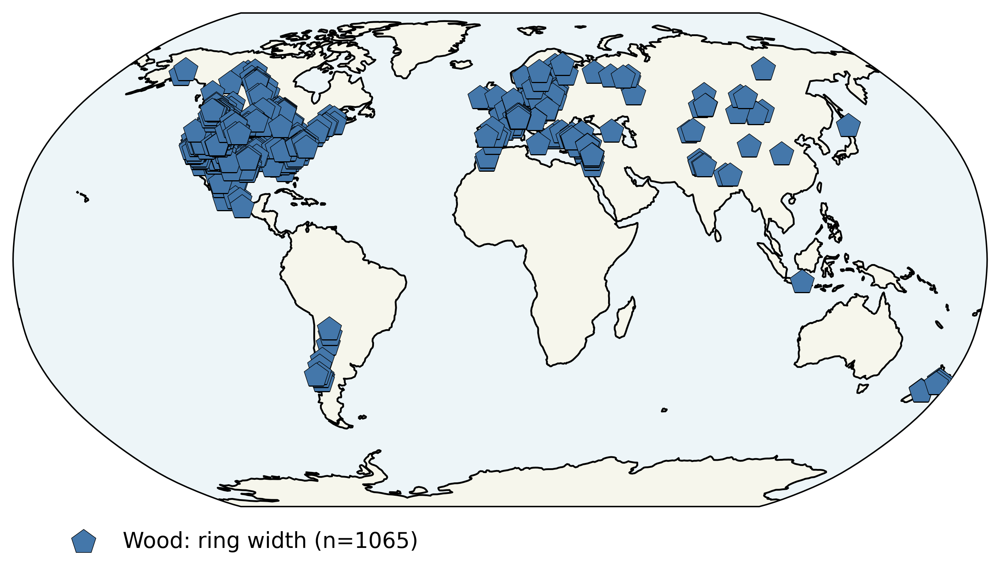

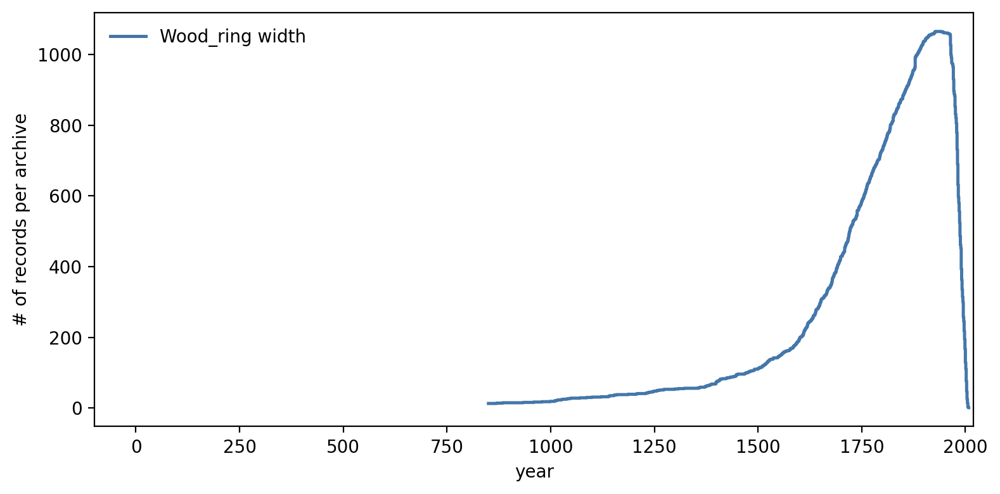

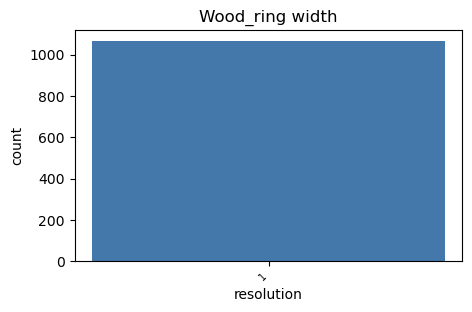

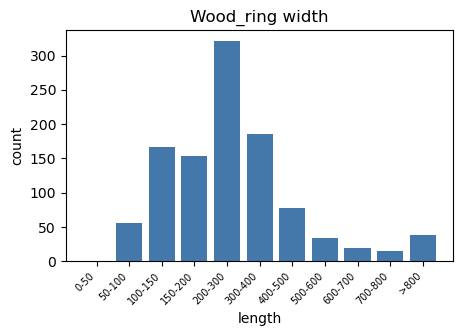

In [6]:
# (1) filter for archiveType and/or paleoData_proxy: 

at = 'Wood'
pt = 'ring width'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.copy().loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt)] # filter records for specific archive and proxy type

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the spatial distribution of records
geo_fig, col = uplt.geo_plot(df_proxy, return_col=True)

# (3) plot the coverage for proxy types and plot resolution

uta.covert_subannual_to_annual(df_proxy)

df_proxy = uta.add_auxvars_plot_summary(df_proxy, key, col=col[at])



#### filter for target period, resolution and minimum record length

Keep 71 records with nyears>=600 during 1000-2000. Exclude 994 records.
Keep 71 records with resolution <=1. Exclude 0 records.


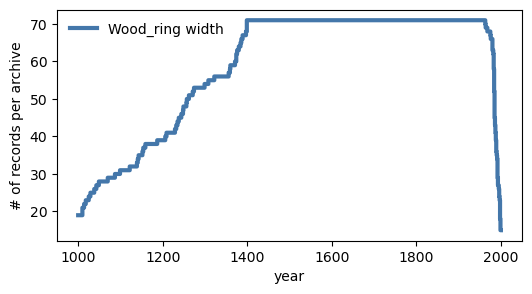

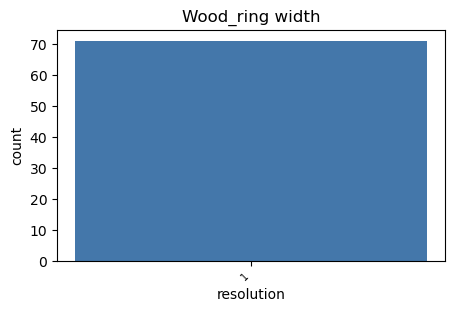

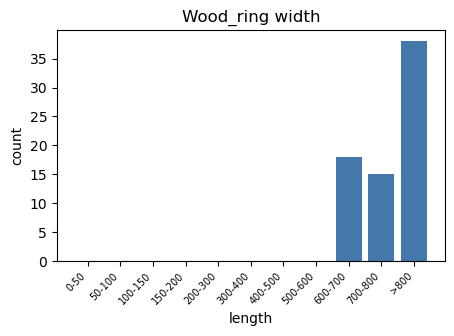

        miny    maxy                   originalDatabase
3     1360.0  1983.0  FE23 (Breitenmoser et al. (2014))
84    1357.0  1975.0  FE23 (Breitenmoser et al. (2014))
174   1153.0  1986.0  FE23 (Breitenmoser et al. (2014))
226   1123.0  2001.0  FE23 (Breitenmoser et al. (2014))
231   1381.0  2000.0  FE23 (Breitenmoser et al. (2014))
...      ...     ...                                ...
1003   850.0  1989.0  FE23 (Breitenmoser et al. (2014))
1007  1390.0  1998.0  FE23 (Breitenmoser et al. (2014))
1023   980.0  1985.0  FE23 (Breitenmoser et al. (2014))
1026  1236.0  1984.0  FE23 (Breitenmoser et al. (2014))
1063  1377.0  1999.0  FE23 (Breitenmoser et al. (2014))

[71 rows x 3 columns]


In [7]:
#========================= PROXY SPECIFIC: Wood ring width =========================
minres    = 1                         # homogenised resolution
mny       = 1000                      # start year of homogenised time coord
mxy       = 2000                      # end year of homogenised time coord
nyears    = np.min([600, mxy-mny])    # minimum length of each record
#====================================================================

# filter for record length during target period
df_proxy = uta.filter_record_length(df_proxy, nyears, mny, mxy)

# filter for resolution
df_proxy = uta.filter_resolution(df_proxy, minres)

# plot coverage and resolution
uplt.plot_coverage_analysis(df_proxy, np.arange(mny, mxy+minres, minres), key, col[at])
uplt.plot_resolution(df_proxy, key, col=col[at])
uplt.plot_length(df_proxy, key, col=col[at])

n_recs = len(df_proxy) # final number of records


print(df_proxy[['miny', 'maxy', 'originalDatabase']])

pca_rec[key] = df_proxy['datasetId']

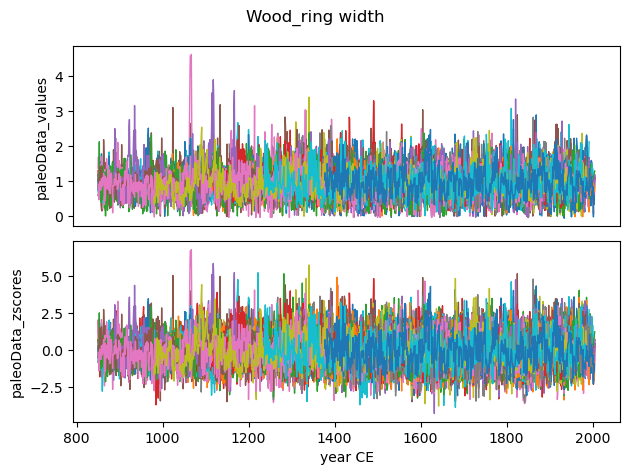

In [8]:
# add 'z-scores' to dataframe and plot z-scores and values
df_proxy = uta.add_zscores_plot(df_proxy, key, plot_output=True)


#### homogenise data dimensions across the records

In [9]:
# define new homogenised time coordinate
df_proxy, years_hom = uta.homogenise_time(df_proxy, mny, mxy, minres)
time[key] = years_hom

Homogenised time coordinate: 1000-2000 CE
Resolution: [1] years
INTERSECT: 1400-1963


In [10]:
# assign the paleoData_values to the non-missing values in the homogenised data array

out = uta.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=False) # returns list of homogenised paleoData_values and paleoData_zscores
paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
new_columns = {'year_hom': [years_hom]*n_recs, 
               'year_hom_avbl': year_hom_avbl, 
               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
df_proxy = df_proxy.assign(**new_columns)

print('Real intersect after homogenising resolution: ')
intrsct = uta.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
                             data='paleoData_zscores_hom_avbl')
data[key] = paleoData_zscores_hom


(71, 1001)
Real intersect after homogenising resolution: 
INTERSECT: 1400-1963


#### PCA

In [11]:
covariance, overlap = uta.calc_covariance_matrix(df_proxy)

short records :  []


saved figure in /figs/dod2k_v2.0_filtered_M_TM/foev_Wood_ring width.pdf


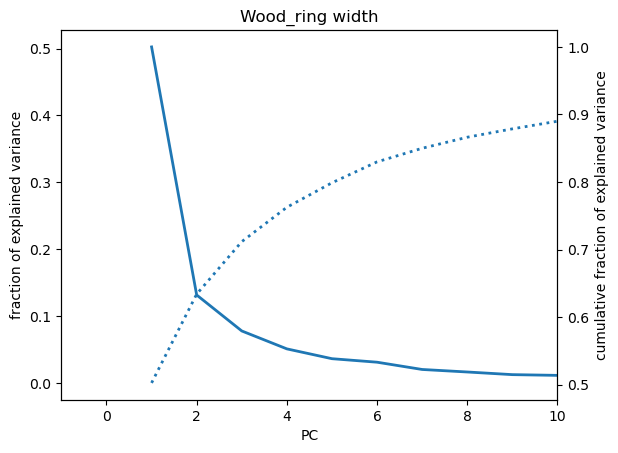

In [12]:
eigenvalues, eigenvectors = uta.PCA(covariance)

foev[key] = uta.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name)

saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0_filtered_M_TM/PCs_Wood_ring width.pdf
saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0_filtered_M_TM/EOFloading_Wood_ring width.pdf


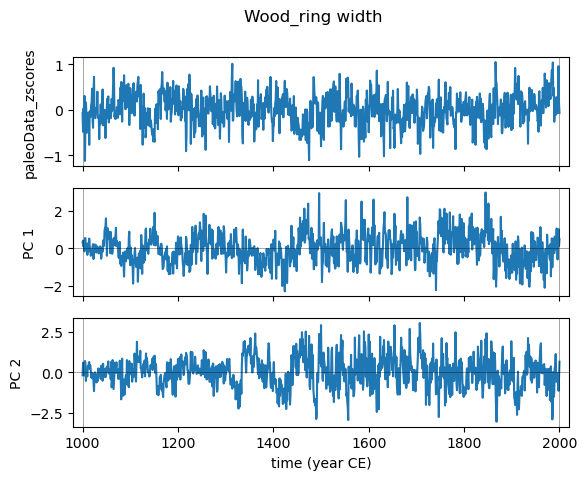

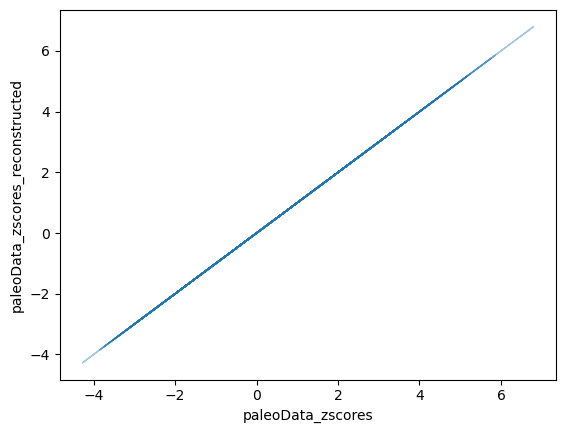

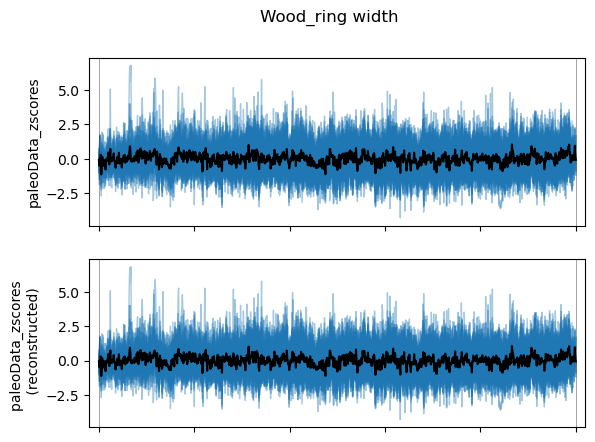

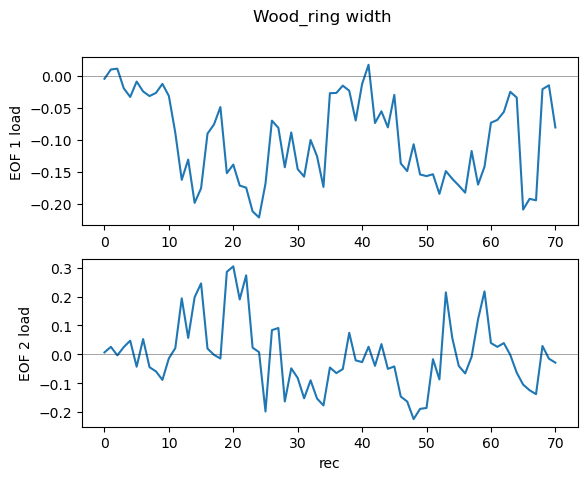

In [13]:
PCs[key], EOFs[key] = uplt.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name)

In [14]:
print('Finished for %s'%key)

Finished for Wood_ring width


### tree d18O

#### filter archive_type and paleoData_proxy

n_records   :  27
archive type:  {'Wood'}
proxy type:    {'d18O'}
0 Wood 3650
1 Speleothem 567
2 Coral 312
3 GlacierIce 162
4 MarineSediment 126
5 LakeSediment 111
6 Documents 13
7 Sclerosponge 6
8 GroundIce 4
9 Borehole 3
10 Other 2
11 MolluskShell 1


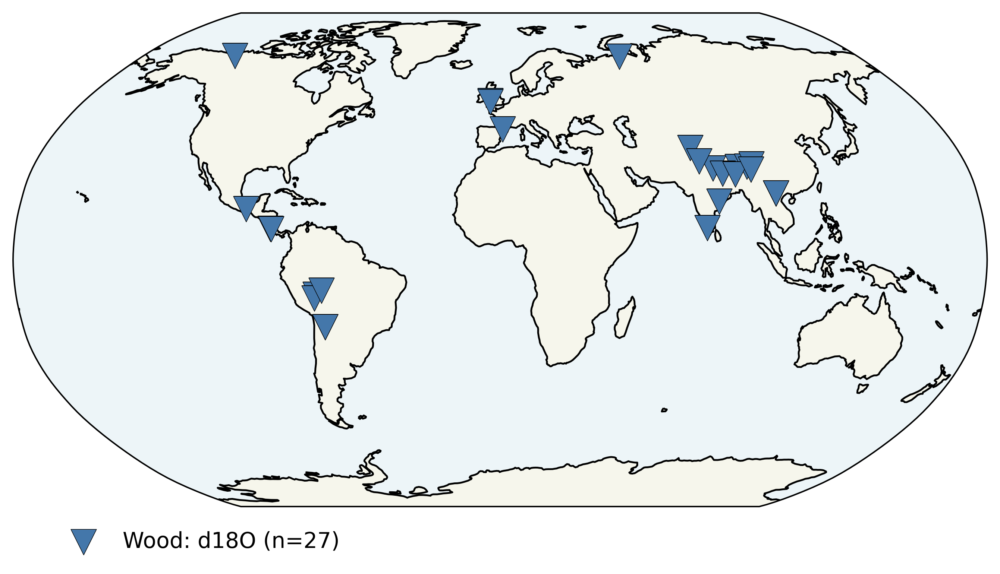

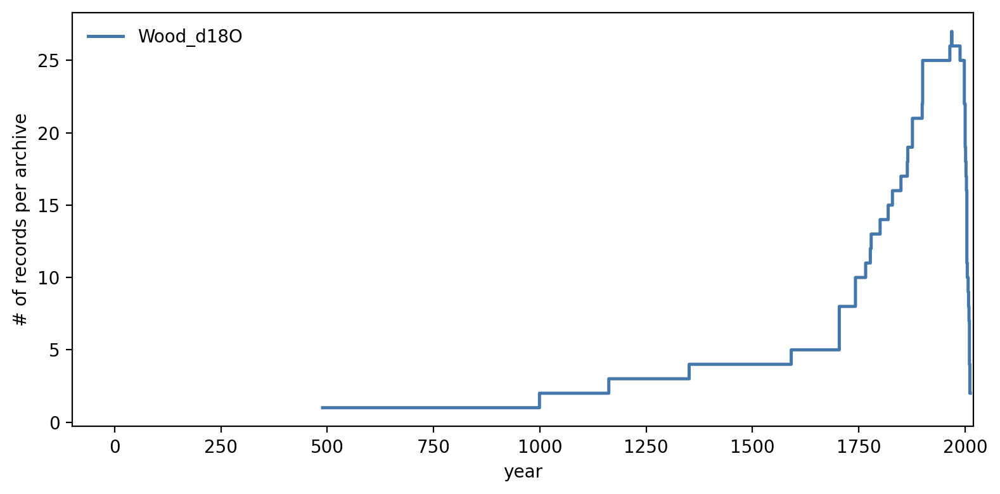

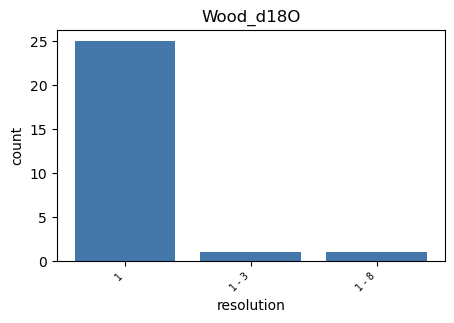

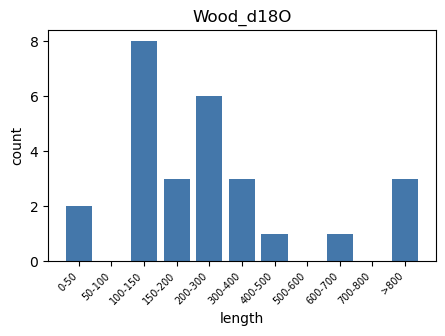

In [15]:
# (1) filter for archiveType and/or paleoData_proxy: 

at = 'Wood'
pt = 'd18O'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.copy().loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt)] # filter records for specific archive and proxy type

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the spatial distribution of records
geo_fig, col = uplt.geo_plot(df_proxy, return_col=True)

# (3) plot the coverage for proxy types and plot resolution

uta.covert_subannual_to_annual(df_proxy)

df_proxy = uta.add_auxvars_plot_summary(df_proxy, key, col=col[at])



#### filter for target period, resolution and minimum record length

In [16]:
df_proxy.keys()

Index(['archiveType', 'dataSetName', 'datasetId', 'duplicateDetails',
       'geo_meanElev', 'geo_meanLat', 'geo_meanLon', 'geo_siteName',
       'interpretation_direction', 'interpretation_seasonality',
       'interpretation_variable', 'interpretation_variableDetail',
       'originalDataURL', 'originalDatabase', 'paleoData_notes',
       'paleoData_proxy', 'paleoData_sensorSpecies', 'paleoData_units',
       'paleoData_values', 'paleoData_variableName', 'year', 'yearUnits',
       'length', 'miny', 'maxy', 'resolution'],
      dtype='object')

Keep 25 records with nyears>=100 during 1700-2000. Exclude 2 records.
Keep 23 records with resolution <=2. Exclude 2 records.


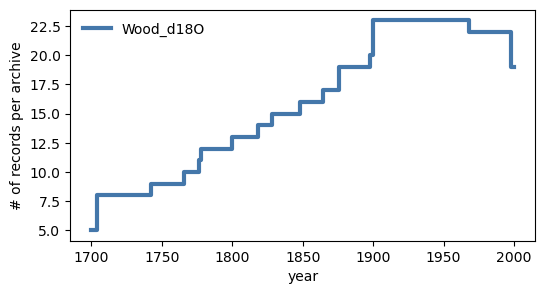

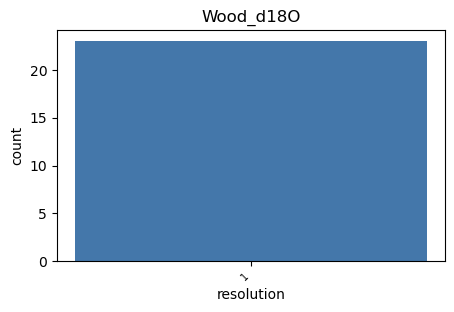

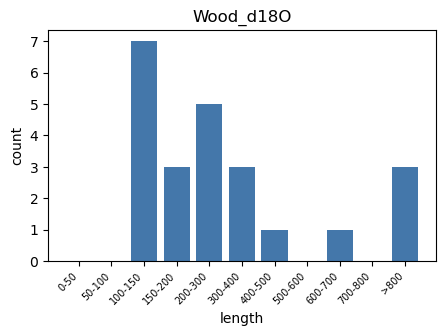

        miny    maxy originalDatabase
1141  1778.0  2000.0     Iso2k v1.1.2
1142  1780.0  2003.0     Iso2k v1.1.2
1153  1901.0  2009.0     Iso2k v1.1.2
1155  1901.0  2001.0     Iso2k v1.1.2
1156  1900.0  2002.0     Iso2k v1.1.2
1160  1000.0  1998.0     Iso2k v1.1.2
1161  1163.0  2005.0     Iso2k v1.1.2
1163  1820.0  2004.0     Iso2k v1.1.2
1171  1352.0  2012.0     Iso2k v1.1.2
1182  1901.0  2010.0     Iso2k v1.1.2
1184  1865.0  1969.0     Iso2k v1.1.2
1185  1830.0  2010.0     Iso2k v1.1.2
1186  1877.0  1998.0     Iso2k v1.1.2
1187  1877.0  1998.0     Iso2k v1.1.2
1188   489.0  2010.0     Iso2k v1.1.2
1189  1801.0  2000.0     Iso2k v1.1.2
1200  1767.0  2008.0     Iso2k v1.1.2
1204  1743.0  2011.0     Iso2k v1.1.2
1212  1705.0  2004.0     Iso2k v1.1.2
1213  1705.0  2004.0     Iso2k v1.1.2
1214  1705.0  2004.0     Iso2k v1.1.2
1226  1592.0  2011.0     Iso2k v1.1.2
1229  1850.0  2012.0     Iso2k v1.1.2


In [17]:
#========================= PROXY SPECIFIC: Wood d18O =========================
minres    = 2                         # homogenised resolution
mny       = 1700                      # start year of homogenised time coord
mxy       = 2000                      # end year of homogenised time coord
nyears    = np.min([100, mxy-mny])    # minimum length of each record
#====================================================================

# filter for record length during target period
df_proxy = uta.filter_record_length(df_proxy, nyears, mny, mxy)

# filter for resolution
df_proxy = uta.filter_resolution(df_proxy, minres)

# plot coverage and resolution
uplt.plot_coverage_analysis(df_proxy, np.arange(mny, mxy+minres, minres), key, col[at])
uplt.plot_resolution(df_proxy, key, col=col[at])
uplt.plot_length(df_proxy, key, col=col[at])

n_recs = len(df_proxy) # final number of records


print(df_proxy[['miny', 'maxy', 'originalDatabase']])

pca_rec[key] = df_proxy['datasetId']

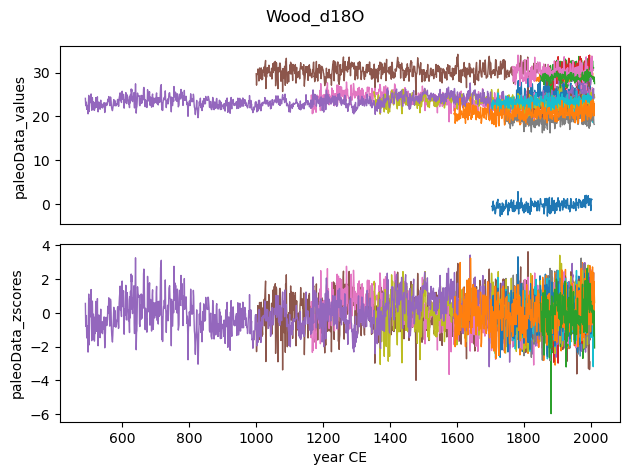

In [18]:
# add 'z-scores' to dataframe and plot z-scores and values
df_proxy = uta.add_zscores_plot(df_proxy, key, plot_output=True)


#### homogenise data dimensions across the records

In [19]:
# define new homogenised time coordinate
df_proxy, years_hom = uta.homogenise_time(df_proxy, mny, mxy, minres)
time[key] = years_hom

Homogenised time coordinate: 1700-2000 CE
Resolution: [2] years
INTERSECT: 1901-1969


In [20]:
# assign the paleoData_values to the non-missing values in the homogenised data array

out = uta.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=False) # returns list of homogenised paleoData_values and paleoData_zscores
paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
new_columns = {'year_hom': [years_hom]*n_recs, 
               'year_hom_avbl': year_hom_avbl, 
               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
df_proxy = df_proxy.assign(**new_columns)

print('Real intersect after homogenising resolution: ')
intrsct = uta.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
                             data='paleoData_zscores_hom_avbl')
data[key] = paleoData_zscores_hom


(23, 151)
Real intersect after homogenising resolution: 
INTERSECT: 1902-1970


#### PCA

In [21]:
covariance, overlap = uta.calc_covariance_matrix(df_proxy)

short records :  [35. 35. 36. 35. 35. 35. 36. 35.]


saved figure in /figs/dod2k_v2.0_filtered_M_TM/foev_Wood_d18O.pdf


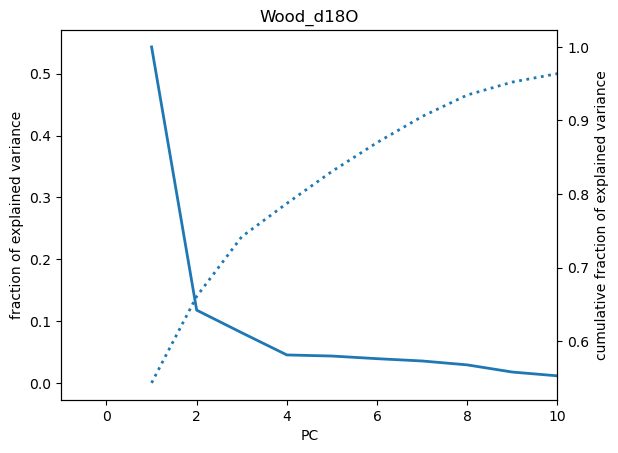

In [22]:
eigenvalues, eigenvectors = uta.PCA(covariance)

foev[key] = uta.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name)

saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0_filtered_M_TM/PCs_Wood_d18O.pdf
saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0_filtered_M_TM/EOFloading_Wood_d18O.pdf


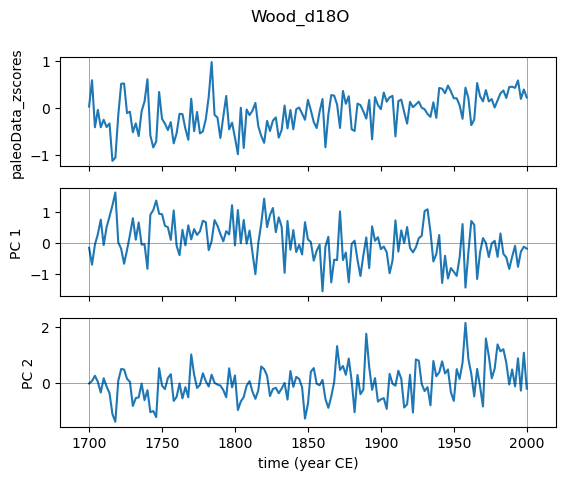

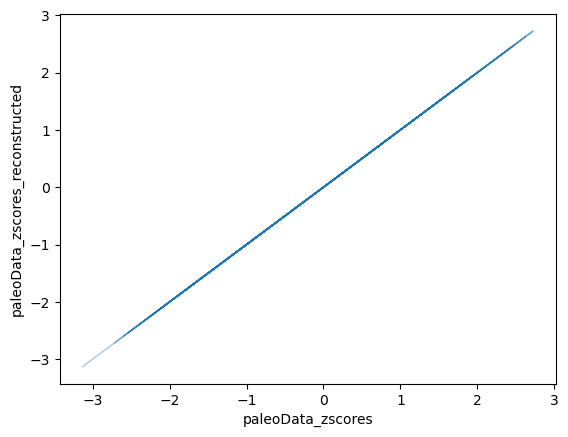

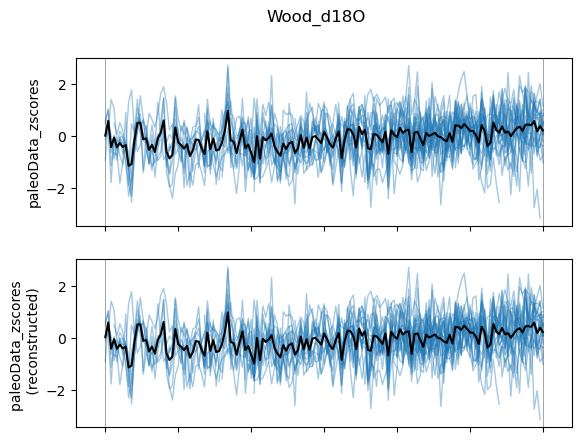

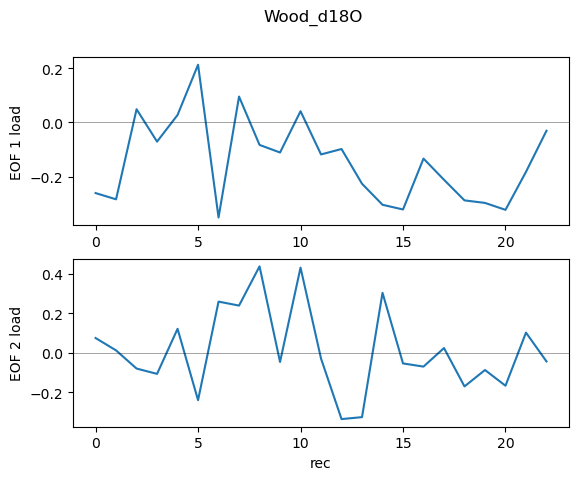

In [23]:
PCs[key], EOFs[key] = uplt.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name)

In [24]:
print('Finished for %s'%key)

Finished for Wood_d18O


### coral d18O

#### filter archive_type and paleoData_proxy

n_records   :  67
archive type:  {'Coral'}
proxy type:    {'d18O'}
0 Wood 3650
1 Speleothem 567
2 Coral 312
3 GlacierIce 162
4 MarineSediment 126
5 LakeSediment 111
6 Documents 13
7 Sclerosponge 6
8 GroundIce 4
9 Borehole 3
10 Other 2
11 MolluskShell 1


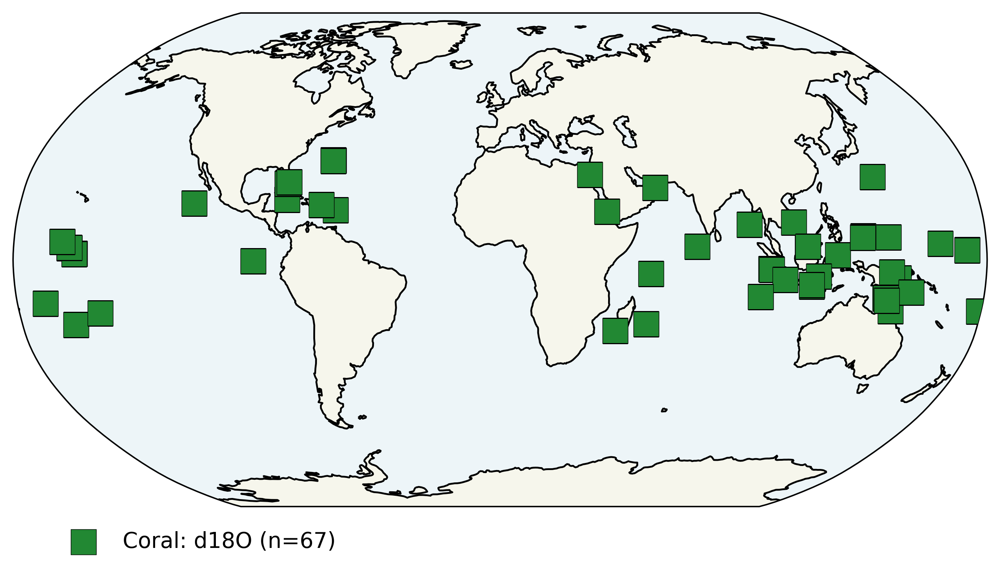

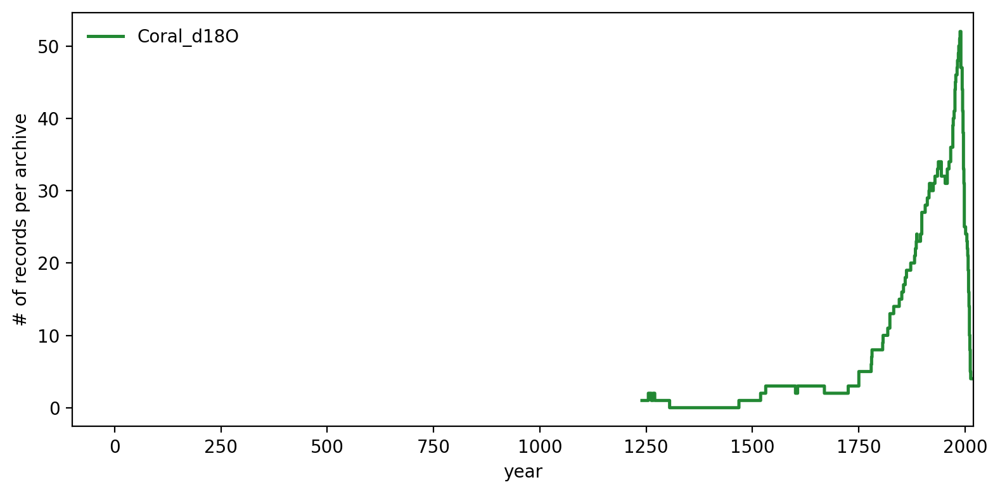

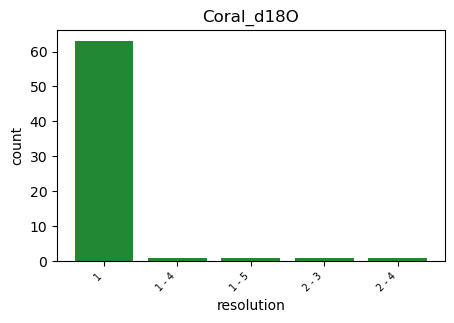

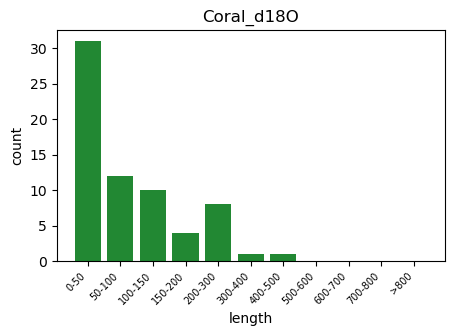

In [25]:
# (1) filter for archiveType and/or paleoData_proxy: 

at = 'Coral'
pt = 'd18O'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.copy().loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt)] # filter records for specific archive and proxy type

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the spatial distribution of records
geo_fig, col = uplt.geo_plot(df_proxy, return_col=True)

# (3) plot the coverage for proxy types and plot resolution

uta.covert_subannual_to_annual(df_proxy)

df_proxy = uta.add_auxvars_plot_summary(df_proxy, key, col=col[at])



#### filter for target period, resolution and minimum record length

Keep 25 records with nyears>=90 during 1750-2000. Exclude 42 records.
Keep 24 records with resolution <=1. Exclude 1 records.


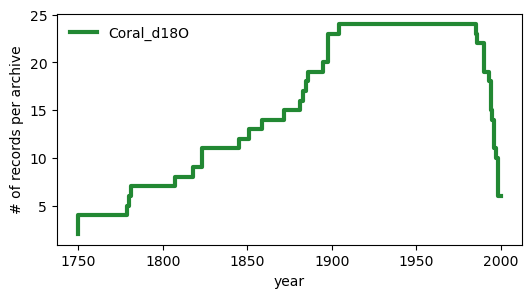

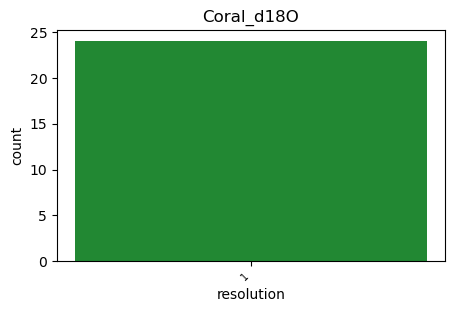

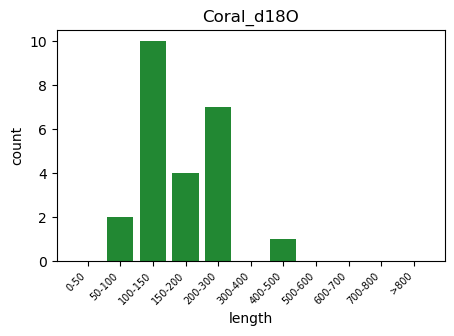

        miny    maxy     originalDatabase
1068  1860.0  1990.0  CoralHydro2k v1.0.1
1069  1887.0  2011.0  CoralHydro2k v1.0.1
1072  1726.0  1996.0  CoralHydro2k v1.0.1
1075  1905.0  2016.0  CoralHydro2k v1.0.1
1084  1899.0  2008.0  CoralHydro2k v1.0.1
1085  1780.0  1997.0  CoralHydro2k v1.0.1
1086  1884.0  1993.0  CoralHydro2k v1.0.1
1090  1824.0  2016.0  CoralHydro2k v1.0.1
1094  1896.0  1998.0  CoralHydro2k v1.0.1
1097  1819.0  1998.0  CoralHydro2k v1.0.1
1102  1520.0  2011.0  CoralHydro2k v1.0.1
1103  1873.0  1994.0  CoralHydro2k v1.0.1
1110  1899.0  1996.0  CoralHydro2k v1.0.1
1116  1751.0  1994.0  CoralHydro2k v1.0.1
1118  1882.0  1994.0  CoralHydro2k v1.0.1
1122  1781.0  1998.0  CoralHydro2k v1.0.1
1123  1808.0  2009.0  CoralHydro2k v1.0.1
1124  1852.0  1990.0  CoralHydro2k v1.0.1
1125  1782.0  1990.0  CoralHydro2k v1.0.1
1127  1846.0  1995.0  CoralHydro2k v1.0.1
1148  1899.0  1996.0         Iso2k v1.1.2
1162  1886.0  1998.0         Iso2k v1.1.2
1166  1824.0  1985.0         Iso2k

In [26]:
#========================= PROXY SPECIFIC: Coral d18O =========================
minres    = 1                         # homogenised resolution
mny       = 1750                      # start year of homogenised time coord
mxy       = 2000                      # end year of homogenised time coord
nyears    = np.min([90, mxy-mny])    # minimum length of each record
#====================================================================
# filter for record length during target period
df_proxy = uta.filter_record_length(df_proxy, nyears, mny, mxy)

# filter for resolution
df_proxy = uta.filter_resolution(df_proxy, minres)

# plot coverage and resolution
uplt.plot_coverage_analysis(df_proxy, np.arange(mny, mxy+minres, minres), key, col[at])
uplt.plot_resolution(df_proxy, key, col=col[at])
uplt.plot_length(df_proxy, key, col=col[at])

n_recs = len(df_proxy) # final number of records


print(df_proxy[['miny', 'maxy', 'originalDatabase']])

pca_rec[key] = df_proxy['datasetId']

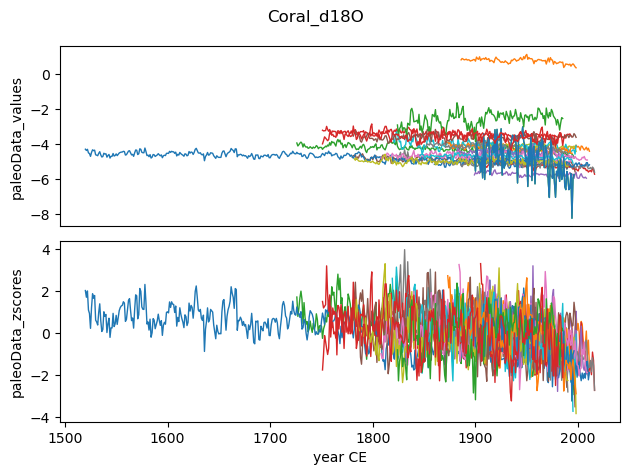

In [27]:
# add 'z-scores' to dataframe and plot z-scores and values
df_proxy = uta.add_zscores_plot(df_proxy, key, plot_output=True)


#### homogenise data dimensions across the records

In [28]:
# define new homogenised time coordinate
df_proxy, years_hom = uta.homogenise_time(df_proxy, mny, mxy, minres)
time[key] = years_hom

Homogenised time coordinate: 1750-2000 CE
Resolution: [1] years
INTERSECT: 1905-1985


In [29]:
# assign the paleoData_values to the non-missing values in the homogenised data array

out = uta.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=False) # returns list of homogenised paleoData_values and paleoData_zscores
paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
new_columns = {'year_hom': [years_hom]*n_recs, 
               'year_hom_avbl': year_hom_avbl, 
               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
df_proxy = df_proxy.assign(**new_columns)

print('Real intersect after homogenising resolution: ')
intrsct = uta.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
                             data='paleoData_zscores_hom_avbl')
data[key] = paleoData_zscores_hom


(24, 251)
Real intersect after homogenising resolution: 
INTERSECT: 1905-1985


#### PCA

In [30]:
covariance, overlap = uta.calc_covariance_matrix(df_proxy)

short records :  []


saved figure in /figs/dod2k_v2.0_filtered_M_TM/foev_Coral_d18O.pdf


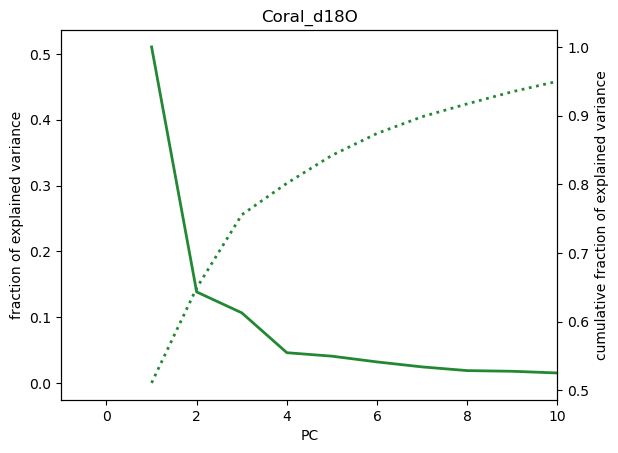

In [31]:
eigenvalues, eigenvectors = uta.PCA(covariance)

foev[key] = uta.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name, col=col[at])

saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0_filtered_M_TM/PCs_Coral_d18O.pdf
saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0_filtered_M_TM/EOFloading_Coral_d18O.pdf


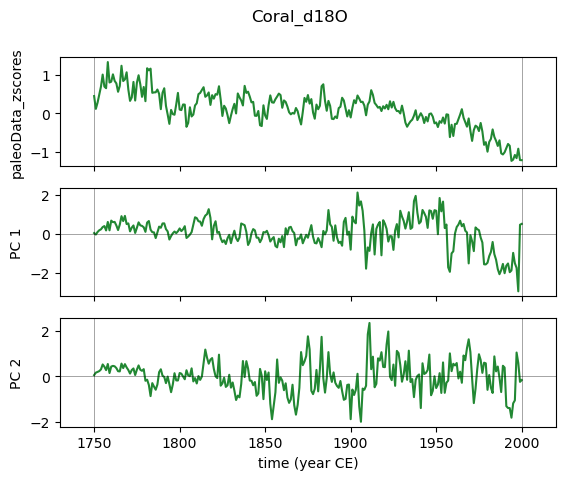

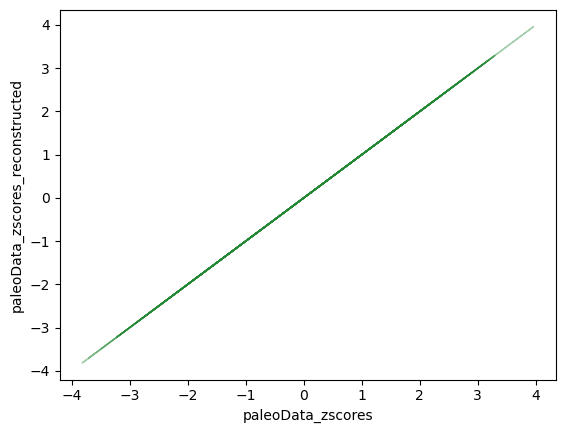

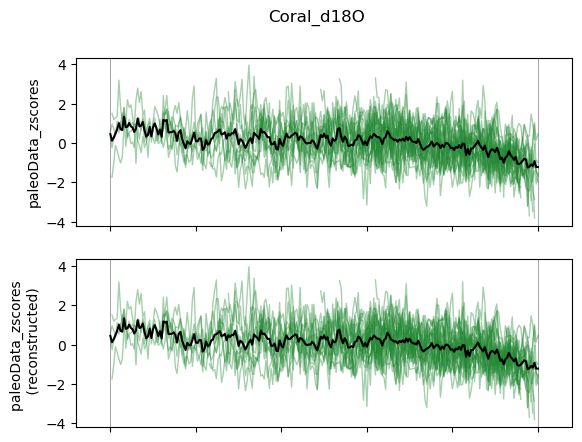

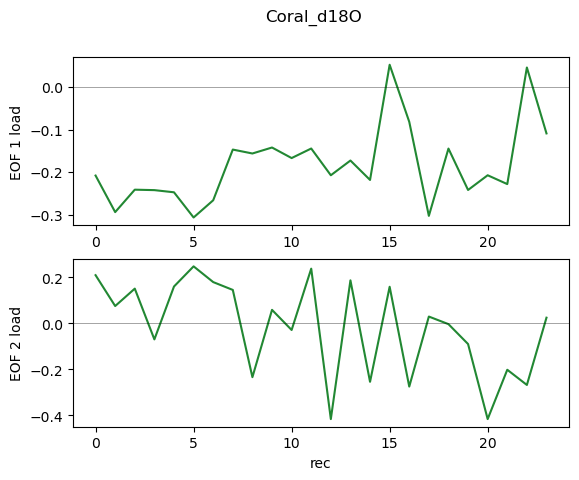

In [32]:
PCs[key], EOFs[key] = uplt.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name, col=col[at])

In [33]:
print('Finished for %s'%key)

Finished for Coral_d18O


### speleothem d18O

#### filter archive_type and paleoData_proxy

n_records   :  210
archive type:  {'Speleothem'}
proxy type:    {'d18O'}
0 Wood 3650
1 Speleothem 567
2 Coral 312
3 GlacierIce 162
4 MarineSediment 126
5 LakeSediment 111
6 Documents 13
7 Sclerosponge 6
8 GroundIce 4
9 Borehole 3
10 Other 2
11 MolluskShell 1


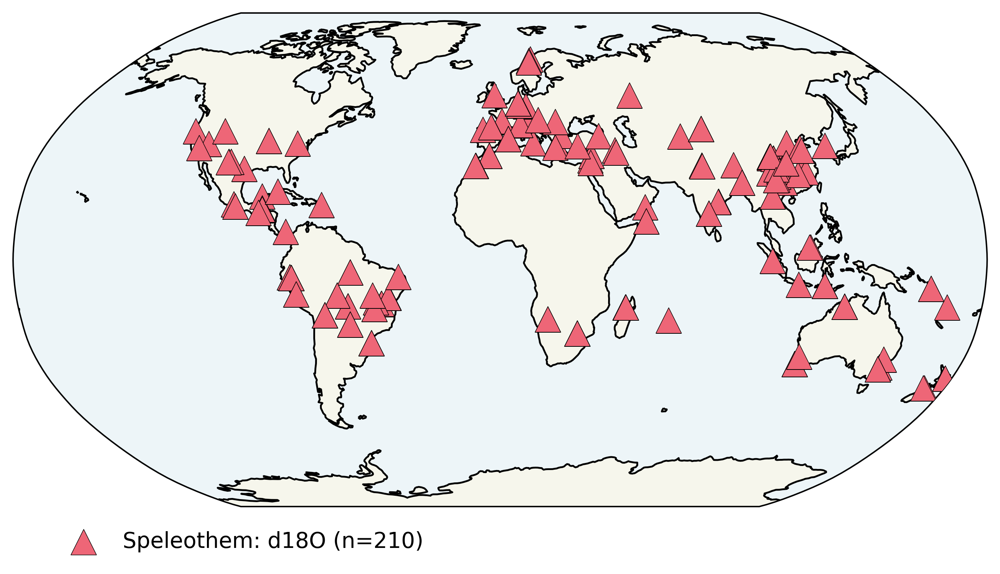

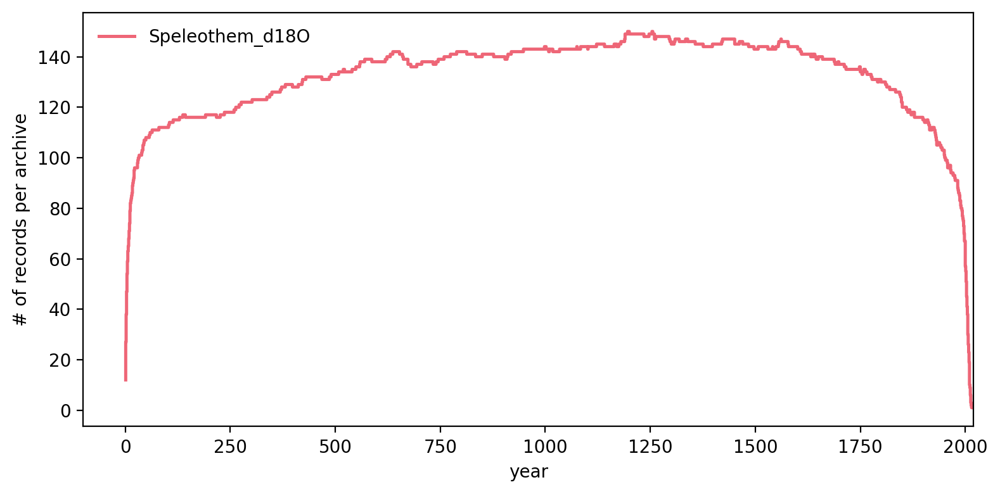

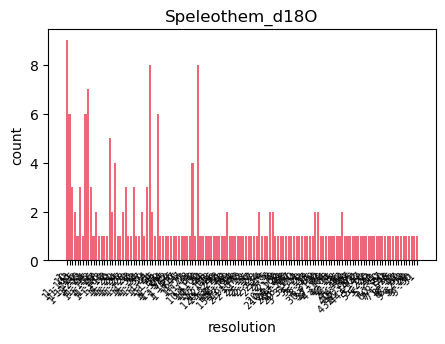

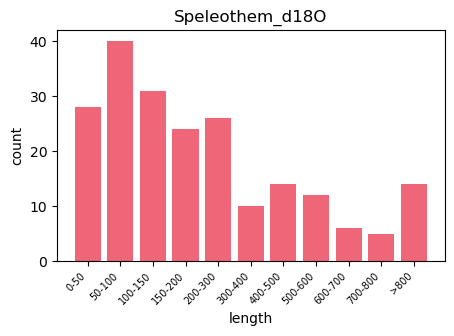

In [34]:
# (1) filter for archiveType and/or paleoData_proxy: 

at = 'Speleothem'
pt = 'd18O'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.copy().loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt)] # filter records for specific archive and proxy type

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the spatial distribution of records
geo_fig, col = uplt.geo_plot(df_proxy, return_col=True)

# (3) plot the coverage for proxy types and plot resolution

uta.covert_subannual_to_annual(df_proxy)

df_proxy = uta.add_auxvars_plot_summary(df_proxy, key, col=col[at])



#### filter for target period, resolution and minimum record length

Keep 23 records with nyears>=500 during 650-1950. Exclude 187 records.
Keep 17 records with resolution <=11. Exclude 6 records.


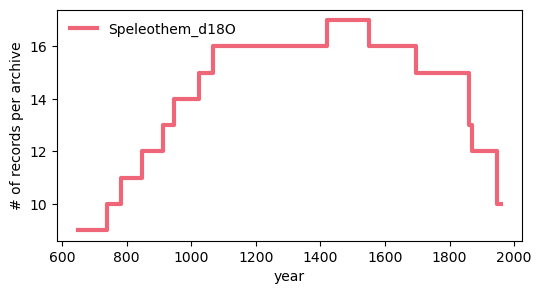

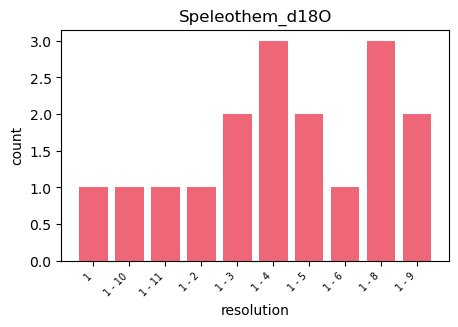

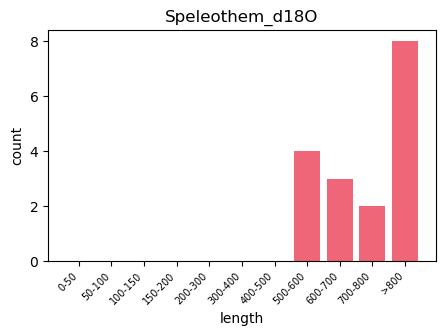

        miny    maxy originalDatabase
1136   624.0  1562.0     Iso2k v1.1.2
1256   790.0  1953.0         SISAL v3
1261   491.0  1860.0         SISAL v3
1266   487.0  2004.0         SISAL v3
1279     1.0  2005.0         SISAL v3
1289     1.0  2010.0         SISAL v3
1290   949.0  1957.0         SISAL v3
1296  1076.0  2007.0         SISAL v3
1310     2.0  1986.0         SISAL v3
1311  1423.0  2010.0         SISAL v3
1325   746.0  2000.0         SISAL v3
1352   851.0  2007.0         SISAL v3
1364     2.0  1879.0         SISAL v3
1382     1.0  1868.0         SISAL v3
1388     2.0  2006.0         SISAL v3
1390   920.0  1699.0         SISAL v3
1414  1035.0  2006.0         SISAL v3


In [35]:
#========================= PROXY SPECIFIC: Speleothem d18O =========================
minres    = 11                         # homogenised resolution
mny       = 650                      # start year of homogenised time coord
mxy       = 1950                      # end year of homogenised time coord
nyears    = np.min([500, mxy-mny])    # minimum length of each record
#====================================================================

# filter for record length during target period
df_proxy = uta.filter_record_length(df_proxy, nyears, mny, mxy)

# filter for resolution
df_proxy = uta.filter_resolution(df_proxy, minres)

# plot coverage and resolution
uplt.plot_coverage_analysis(df_proxy, np.arange(mny, mxy+minres, minres), key, col[at])
uplt.plot_resolution(df_proxy, key, col=col[at])
uplt.plot_length(df_proxy, key, col=col[at])

n_recs = len(df_proxy) # final number of records


print(df_proxy[['miny', 'maxy', 'originalDatabase']])

pca_rec[key] = df_proxy['datasetId']

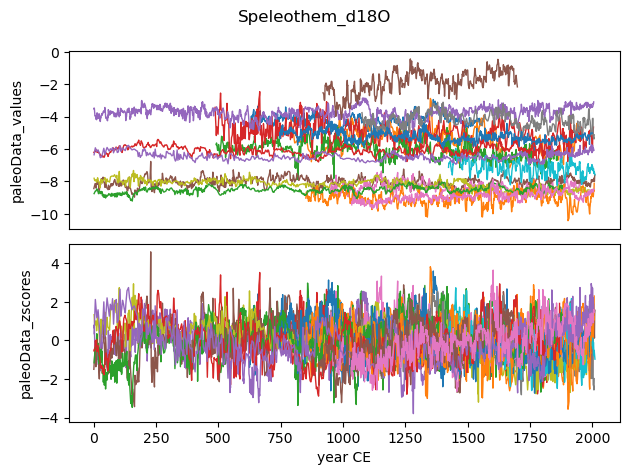

In [36]:
# add 'z-scores' to dataframe and plot z-scores and values
df_proxy = uta.add_zscores_plot(df_proxy, key, plot_output=True)


#### homogenise data dimensions across the records

In [37]:
# define new homogenised time coordinate
df_proxy, years_hom = uta.homogenise_time(df_proxy, mny, mxy, minres)
time[key] = years_hom

Homogenised time coordinate: 650-1959 CE
Resolution: [11] years
No shared period across all records.


In [38]:
# assign the paleoData_values to the non-missing values in the homogenised data array

out = uta.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=False) # returns list of homogenised paleoData_values and paleoData_zscores
paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
new_columns = {'year_hom': [years_hom]*n_recs, 
               'year_hom_avbl': year_hom_avbl, 
               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
df_proxy = df_proxy.assign(**new_columns)

print('Real intersect after homogenising resolution: ')
intrsct = uta.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
                             data='paleoData_zscores_hom_avbl')
data[key] = paleoData_zscores_hom


(17, 120)
Real intersect after homogenising resolution: 
INTERSECT: 1431-1563


#### PCA

In [39]:
covariance, overlap = uta.calc_covariance_matrix(df_proxy)

short records :  [13. 13. 26. 26.]


saved figure in /figs/dod2k_v2.0_filtered_M_TM/foev_Speleothem_d18O.pdf


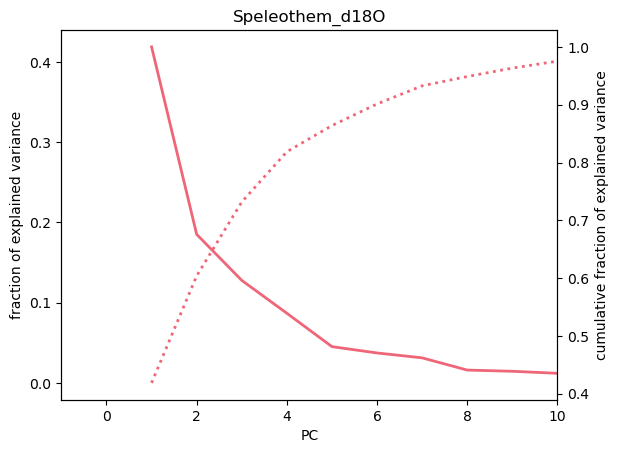

In [40]:
eigenvalues, eigenvectors = uta.PCA(covariance)

foev[key] = uta.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name, col=col[at])

saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0_filtered_M_TM/PCs_Speleothem_d18O.pdf
saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0_filtered_M_TM/EOFloading_Speleothem_d18O.pdf


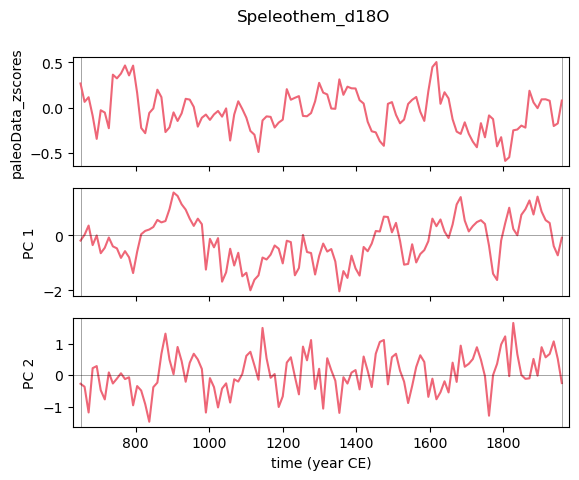

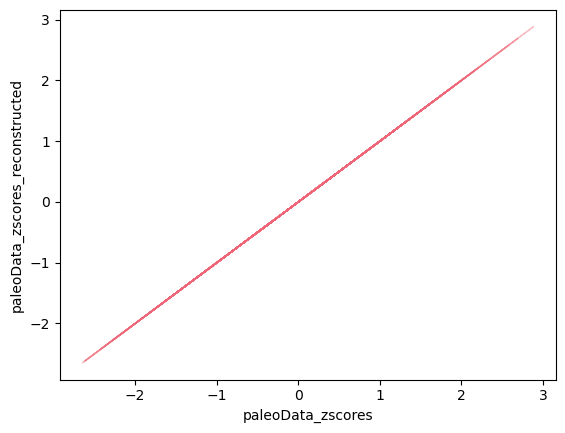

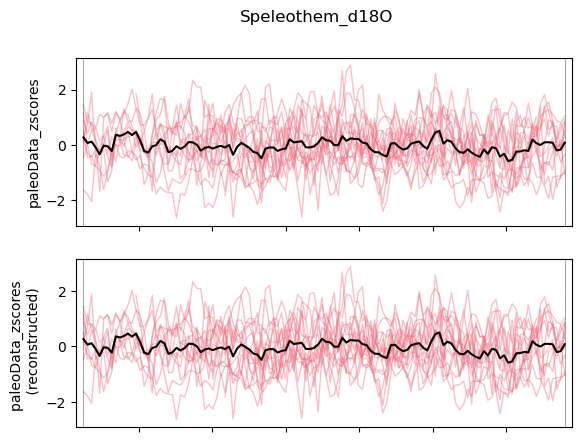

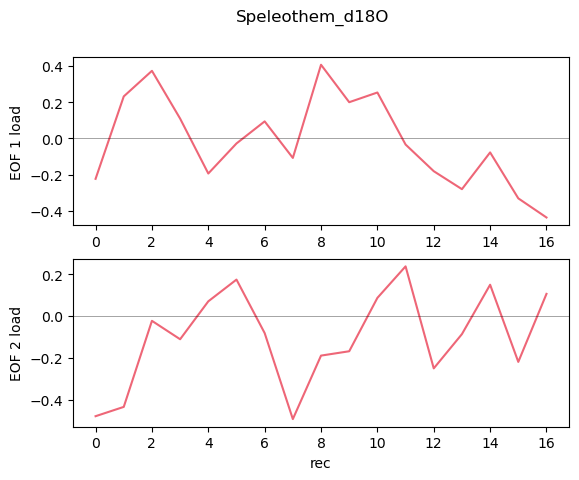

In [41]:
PCs[key], EOFs[key] = uplt.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name, col=col[at])

In [42]:
print('Finished for %s'%key)

Finished for Speleothem_d18O


### lake sediment d18O + dD

#### filter archive_type and paleoData_proxy

n_records   :  35
archive type:  {'LakeSediment'}
proxy type:    {'dD', 'd18O'}
0 Wood 3650
1 Speleothem 567
2 Coral 312
3 GlacierIce 162
4 MarineSediment 126
5 LakeSediment 111
6 Documents 13
7 Sclerosponge 6
8 GroundIce 4
9 Borehole 3
10 Other 2
11 MolluskShell 1


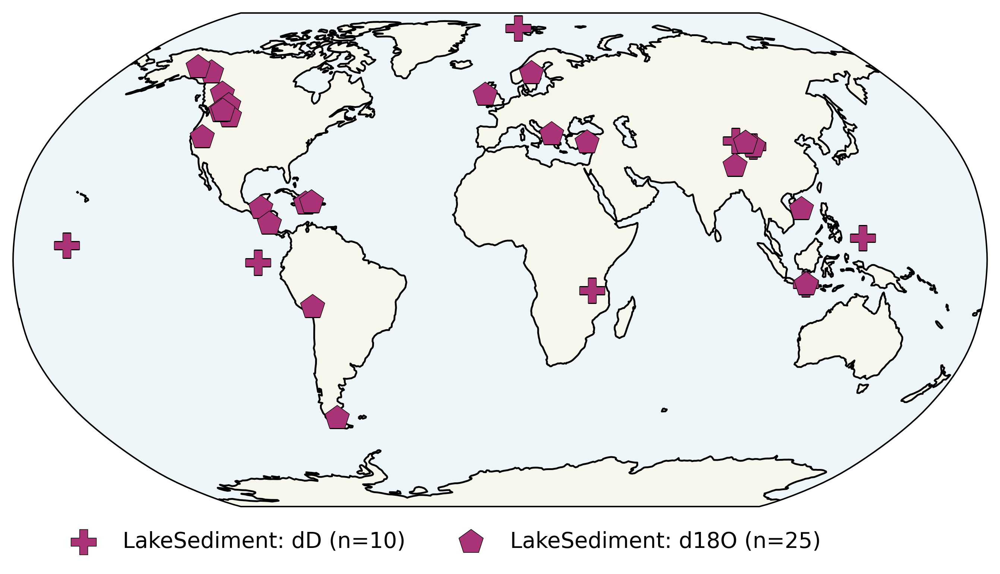

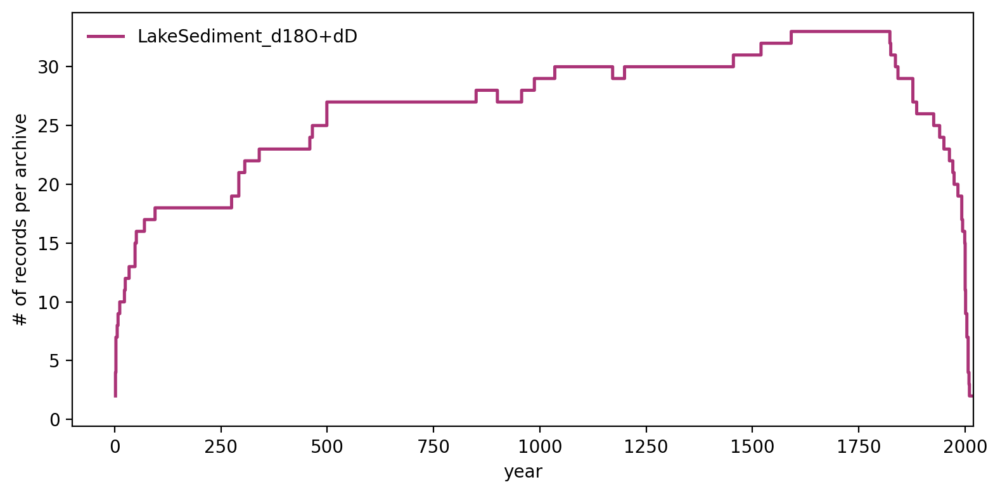

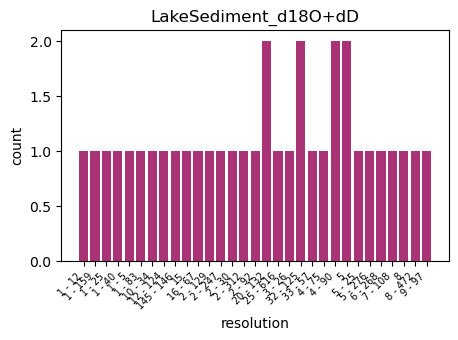

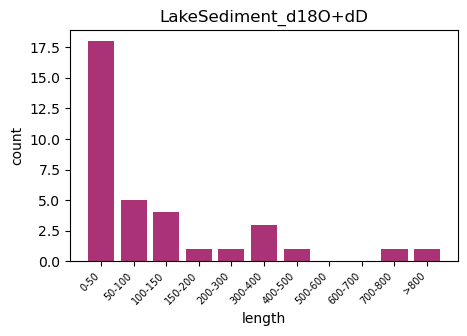

In [43]:
# (1) filter for archiveType and/or paleoData_proxy: 

at = 'LakeSediment'
pt  = 'd18O+dD'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt.split('+')[0])|(df['paleoData_proxy']==pt.split('+')[1])]

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the spatial distribution of records
geo_fig, col = uplt.geo_plot(df_proxy, return_col=True)

# (3) plot the coverage for proxy types and plot resolution

uta.covert_subannual_to_annual(df_proxy)

df_proxy = uta.add_auxvars_plot_summary(df_proxy, key, col=col[at])



#### filter for target period, resolution and minimum record length

Keep 10 records with nyears>=100 during 300-1800. Exclude 25 records.
Keep 9 records with resolution <=55. Exclude 1 records.


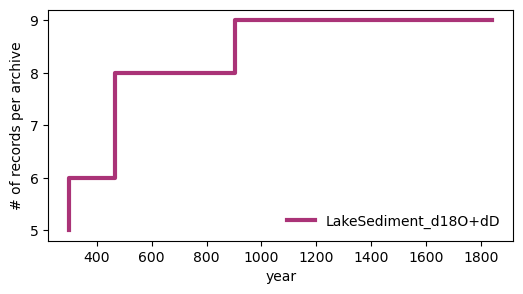

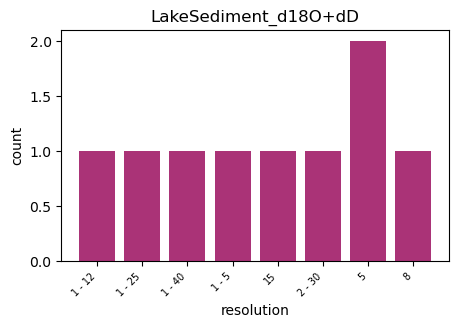

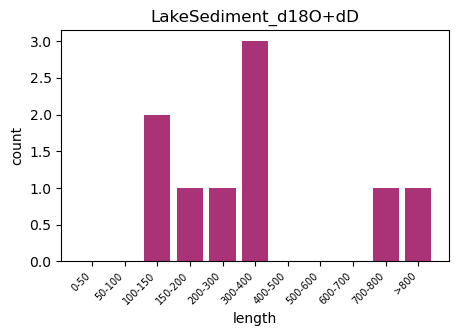

       miny    maxy originalDatabase
1132    7.0  2007.0     Iso2k v1.1.2
1151    2.0  2009.0     Iso2k v1.1.2
1158  276.0  2001.0     Iso2k v1.1.2
1192  958.0  1940.0     Iso2k v1.1.2
1194  341.0  2004.0     Iso2k v1.1.2
1202    2.0  1842.0     Iso2k v1.1.2
1203   13.0  1963.0     Iso2k v1.1.2
1210  500.0  2000.0     Iso2k v1.1.2
1222  500.0  2000.0     Iso2k v1.1.2


In [44]:
#========================= PROXY SPECIFIC: LakeSediment d18O+dD =========================
minres    = 55                         # homogenised resolution
mny       = 300                      # start year of homogenised time coord
mxy       = 1800                      # end year of homogenised time coord
nyears    = np.min([100, mxy-mny])    # minimum length of each record
#====================================================================

# filter for record length during target period
df_proxy = uta.filter_record_length(df_proxy, nyears, mny, mxy)

# filter for resolution
df_proxy = uta.filter_resolution(df_proxy, minres)

# plot coverage and resolution
uplt.plot_coverage_analysis(df_proxy, np.arange(mny, mxy+minres, minres), key, col[at])
uplt.plot_resolution(df_proxy, key, col=col[at])
uplt.plot_length(df_proxy, key, col=col[at])

n_recs = len(df_proxy) # final number of records


print(df_proxy[['miny', 'maxy', 'originalDatabase']])

pca_rec[key] = df_proxy['datasetId']

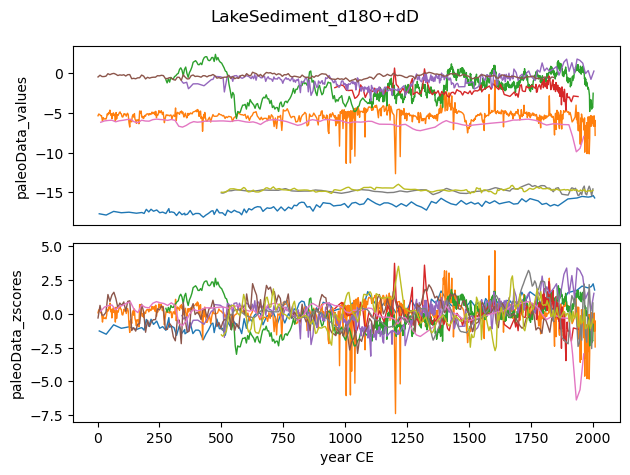

In [45]:
# add 'z-scores' to dataframe and plot z-scores and values
df_proxy = uta.add_zscores_plot(df_proxy, key, plot_output=True)


#### homogenise data dimensions across the records

In [46]:
# define new homogenised time coordinate
df_proxy, years_hom = uta.homogenise_time(df_proxy, mny, mxy, minres)
time[key] = years_hom

Homogenised time coordinate: 300-1840 CE
Resolution: [55] years
No shared period across all records.


In [47]:
# assign the paleoData_values to the non-missing values in the homogenised data array

out = uta.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=False) # returns list of homogenised paleoData_values and paleoData_zscores
paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
new_columns = {'year_hom': [years_hom]*n_recs, 
               'year_hom_avbl': year_hom_avbl, 
               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
df_proxy = df_proxy.assign(**new_columns)

print('Real intersect after homogenising resolution: ')
intrsct = uta.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
                             data='paleoData_zscores_hom_avbl')
data[key] = paleoData_zscores_hom


(9, 29)
Real intersect after homogenising resolution: 
INTERSECT: 960-1840


#### PCA

In [48]:
covariance, overlap = uta.calc_covariance_matrix(df_proxy)

short records :  [29. 29. 29. 17. 28. 29. 29. 25. 25. 29. 29. 29. 17. 28. 29. 29. 25. 25.
 29. 29. 29. 17. 28. 29. 29. 25. 25. 17. 17. 17. 17. 17. 17. 17. 17. 17.
 28. 28. 28. 17. 28. 28. 28. 25. 25. 29. 29. 29. 17. 28. 29. 29. 25. 25.
 29. 29. 29. 17. 28. 29. 29. 25. 25. 25. 25. 25. 17. 25. 25. 25. 25. 25.
 25. 25. 25. 17. 25. 25. 25. 25. 25.]


saved figure in /figs/dod2k_v2.0_filtered_M_TM/foev_LakeSediment_d18O+dD.pdf


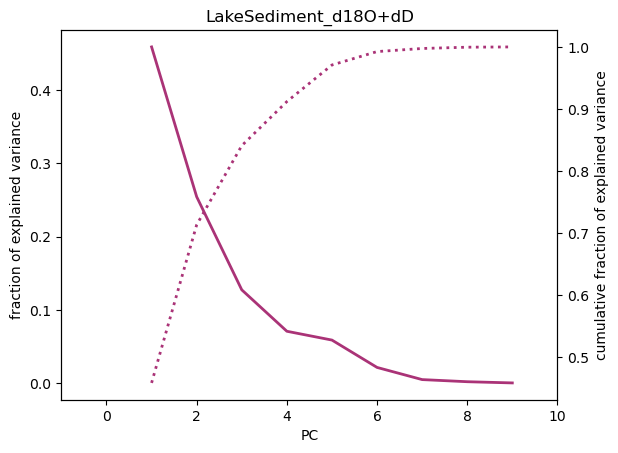

In [49]:
eigenvalues, eigenvectors = uta.PCA(covariance)

foev[key] = uta.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name, col=col[at])

saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0_filtered_M_TM/PCs_LakeSediment_d18O+dD.pdf
saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0_filtered_M_TM/EOFloading_LakeSediment_d18O+dD.pdf


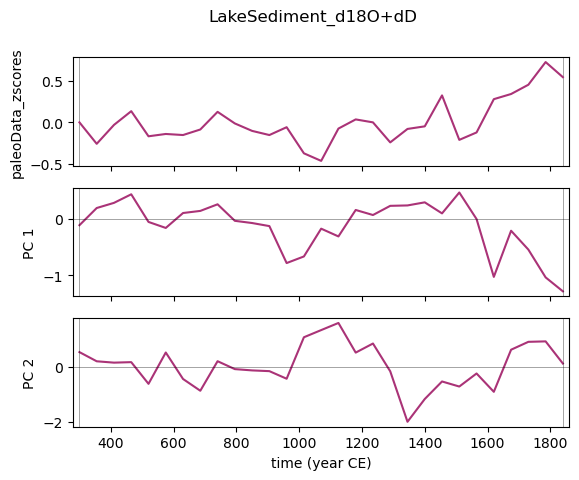

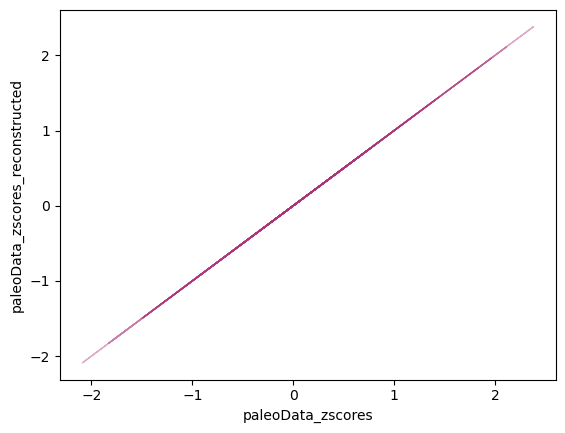

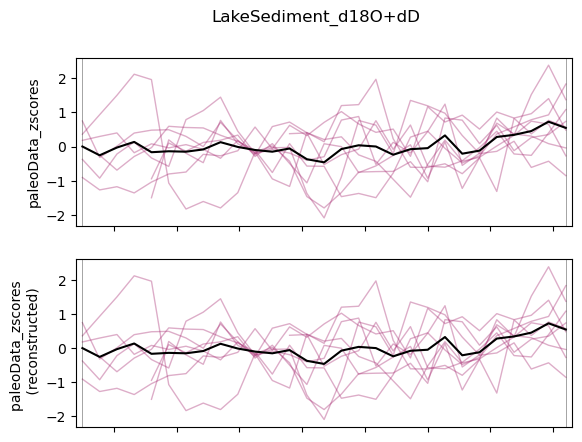

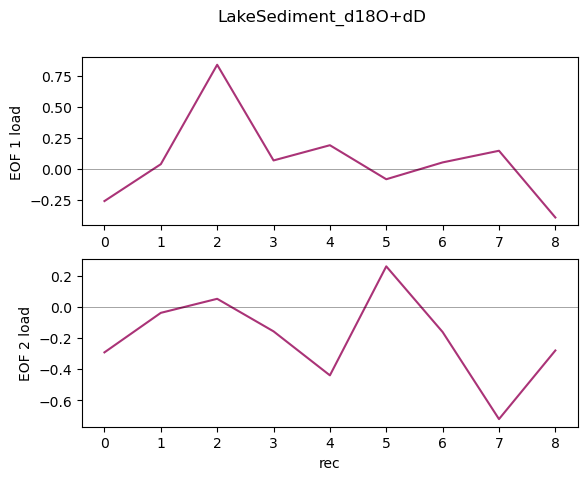

In [50]:
PCs[key], EOFs[key] = uplt.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name, col=col[at])

In [51]:
print('Finished for %s'%key)

Finished for LakeSediment_d18O+dD


### marine sediment d18O

#### filter archive_type and paleoData_proxy

In [52]:
# # (1) filter for archiveType and/or paleoData_proxy: 

# at = 'MarineSediment'
# pt = 'd18O'
# key = '%s_%s'%(at, pt)

# keys += [key]

# df_proxy = df.copy().loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt)] # filter records for specific archive and proxy type

# n_recs = len(df_proxy) # number of records
# print('n_records   : ', n_recs)

# print('archive type: ', set(df_proxy['archiveType']))
# print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# # (2) plot the spatial distribution of records
# geo_fig, col = uplt.geo_plot(df_proxy, return_col=True)

# # (3) plot the coverage for proxy types and plot resolution

# uta.covert_subannual_to_annual(df_proxy)

# df_proxy = uta.add_auxvars_plot_summary(df_proxy, key, col=col[at])



#### filter for target period, resolution and minimum record length

In [53]:
# #========================= PROXY SPECIFIC: MarineSediment d18O =========================
# minres    = 100                         # homogenised resolution
# mny       = 100                      # start year of homogenised time coord
# mxy       = 1800                      # end year of homogenised time coord
# nyears    = np.min([100, mxy-mny])    # minimum length of each record
# #====================================================================

# # filter for record length during target period
# df_proxy = uta.filter_record_length(df_proxy, nyears, mny, mxy)

# # filter for resolution
# df_proxy = uta.filter_resolution(df_proxy, minres)

# # plot coverage and resolution
# uplt.plot_coverage_analysis(df_proxy, np.arange(mny, mxy+minres, minres), key, col[at])
# uplt.plot_resolution(df_proxy, key)
# uplt.plot_length(df_proxy, key)

# n_recs = len(df_proxy) # final number of records


# print(df_proxy[['miny', 'maxy', 'originalDatabase']])

# pca_rec[key] = df_proxy['datasetId']

In [54]:
# # add 'z-scores' to dataframe and plot z-scores and values
# df_proxy = uta.add_zscores_plot(df_proxy, key, plot_output=True)


#### homogenise data dimensions across the records

In [55]:
# # define new homogenised time coordinate
# df_proxy, years_hom = uta.homogenise_time(df_proxy, mny, mxy, minres)
# time[key] = years_hom

In [56]:
# # assign the paleoData_values to the non-missing values in the homogenised data array

# out = uta.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=False) # returns list of homogenised paleoData_values and paleoData_zscores
# paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# # define new columns in df_filt
# new_columns = {'year_hom': [years_hom]*n_recs, 
#                'year_hom_avbl': year_hom_avbl, 
#                'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
#                'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
#                'paleoData_zscores_hom_avbl': zsco_hom_avbl}
# df_proxy = df_proxy.assign(**new_columns)

# print('Real intersect after homogenising resolution: ')
# intrsct = uta.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
#                              data='paleoData_zscores_hom_avbl')
# data[key] = paleoData_zscores_hom


#### PCA

In [57]:
# covariance, overlap = uta.calc_covariance_matrix(df_proxy)

In [58]:
# eigenvalues, eigenvectors = uta.PCA(covariance)

# foev[key] = uta.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name)

In [59]:
# PCs[key], EOFs[key] = uplt.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name)

In [60]:
# print('Finished for %s'%key)

## summary figures

In [61]:
archive_colour, archives_sorted, proxy_marker = uplt.df_colours_markers()

0 Wood 3650
1 Speleothem 567
2 Coral 312
3 GlacierIce 162
4 MarineSediment 126
5 LakeSediment 111
6 Documents 13
7 Sclerosponge 6
8 GroundIce 4
9 Borehole 3
10 Other 2
11 MolluskShell 1


In [62]:
key_colour = {}
for key in keys:
    key_colour[key]=archive_colour[key.split('_')[0]]

key_colour['Wood_d18O']='k'

### mean z-score

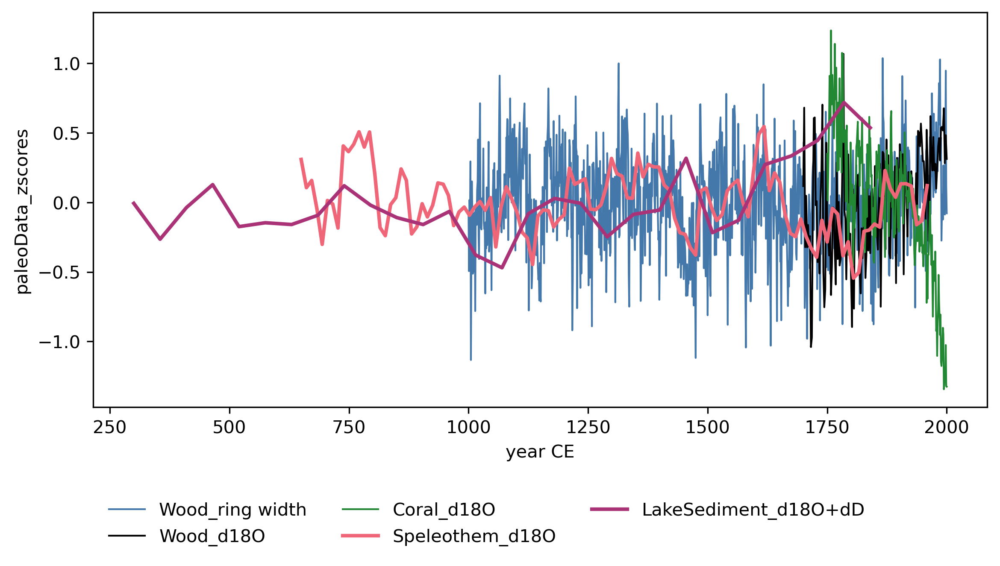

In [63]:
# as a comparison plot the mean over all records
fig = plt.figure(figsize=(9, 4), dpi=300)
for key in keys:
    lw = 1 if key in ['Wood_ring width', 'Wood_d18O', 'Coral_d18O'] else 2
    plt.plot(time[key], np.ma.mean(data[key], axis=0)-np.mean(np.ma.mean(data[key], axis=0)), 
             label=key, lw=lw, color=key_colour[key])
plt.ylabel('paleoData_zscores')
plt.xlabel('year CE')
plt.legend(ncol=3, bbox_to_anchor=(0,-0.2), loc='upper left', framealpha=0)
plt.show()

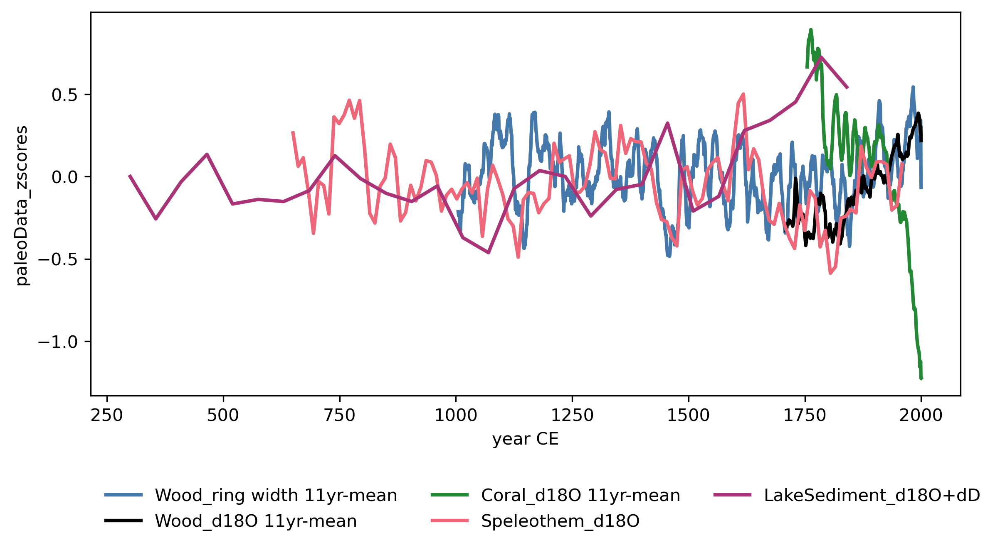

In [65]:
# as a comparison plot the mean over all records SMOOTHED
fig = plt.figure(figsize=(9, 4), dpi=300)
for key in keys:
    if key in ['Wood_ring width', 'Wood_d18O', 'Coral_d18O']:
        tt, dd = uta.smooth(np.ma.mean(data[key], axis=0), time[key], 11)
        label=key+' 11yr-mean'
    else:
        tt, dd = time[key], np.ma.mean(data[key], axis=0)
        label=key
    plt.plot(tt, dd, label=label, lw=2, color=key_colour[key])
plt.ylabel('paleoData_zscores')
plt.xlabel('year CE')    
plt.legend(ncol=3, bbox_to_anchor=(0,-0.2), loc='upper left', framealpha=0)
plt.show()

### Fraction of Explained Variance

Wood_ring width
Wood_d18O
Coral_d18O
Speleothem_d18O
LakeSediment_d18O+dD


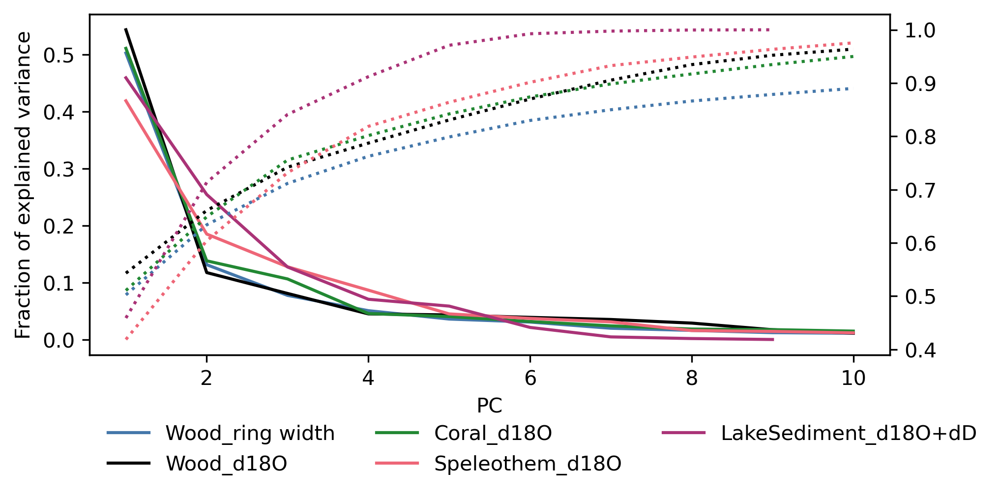

In [71]:
fig = plt.figure(figsize=(7,3), dpi=300)
ax  = plt.gca()
ax2 = ax.twinx()
for key in keys:
    print(key)
    ax.plot(range(1,len(foev[key][:10])+1), foev[key][:10], label=key, color=key_colour[key])
    ax2.plot(range(1,len(foev[key][:10])+1), np.cumsum(foev[key][:10]), label=key, ls=':', color=key_colour[key])
ax.set_ylabel('Fraction of explained variance')
# ax2.set_ylabel('Cumulative fraction of explained variance')
ax.set_xlabel('PC')    
ax.legend(ncol=3, bbox_to_anchor=(0,-0.15), loc='upper left', framealpha=0)

### 1st and 2nd PC

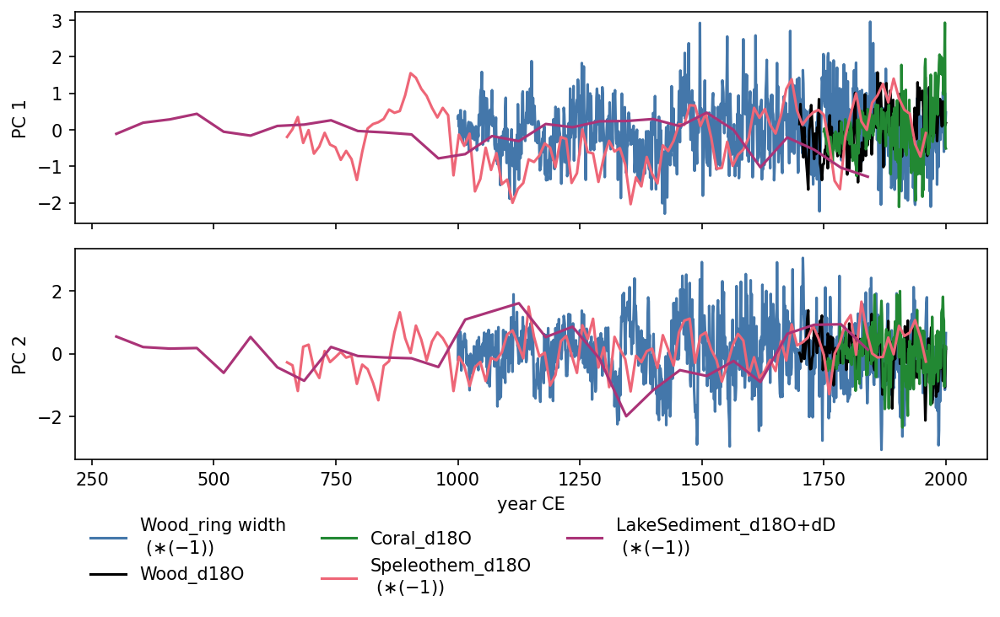

In [74]:
# plot PCs of different proxy types on the same axis. 
# Note that these are plotted as calculated in the respective analysis- NOT standardised differently!

fig = plt.figure(figsize=(8,5), dpi=150)

grid = GS(2,1)
for ii in range(2):
    ax = plt.subplot(grid[ii,:])
    for key in keys:
        a=1 if key in ['Wood_ring width', 'Speleothem_d18O', 'LakeSediment_d18O+dD'] else -1
        label = key+ '\n ($\\ast(-1)$)' if key in ['Wood_ring width', 'Speleothem_d18O', 'LakeSediment_d18O+dD'] else key
        plt.plot(time[key], a*PCs[key][ii], label=label, color=key_colour[key])
    if ii==0: 
        ax.axes.xaxis.set_ticklabels([])
    plt.ylabel('PC %d'%(ii+1)) 
plt.xlabel('year CE')

plt.legend(ncol=3, bbox_to_anchor=(0,-0.2), 
           loc='upper left', framealpha=0)
grid.tight_layout(fig)



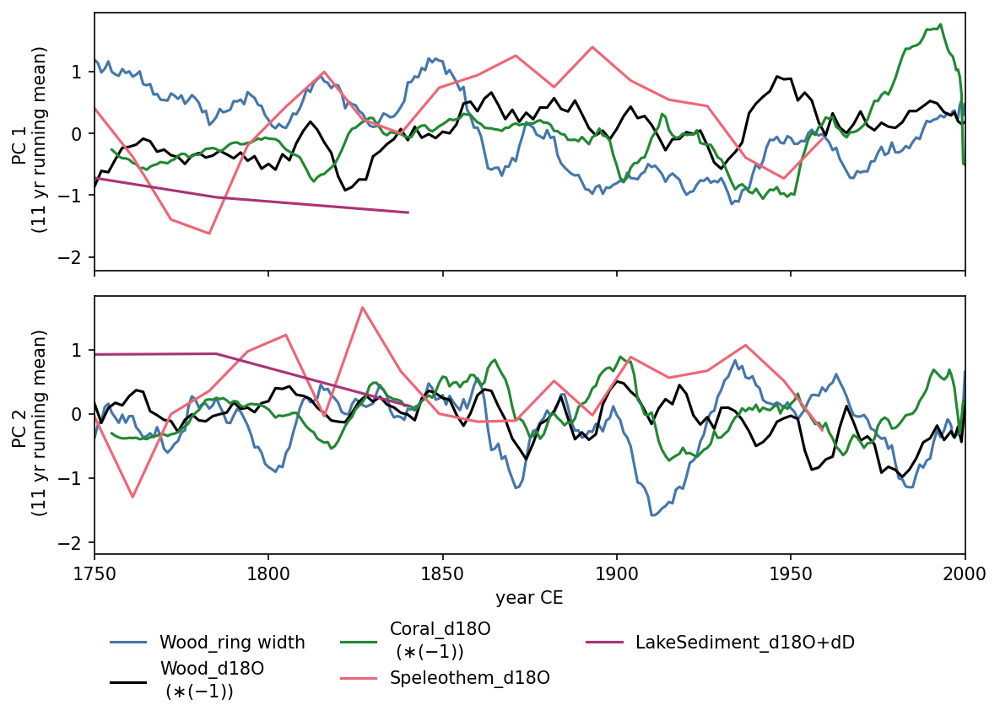

In [76]:
# plot PCs of different proxy types on the same axis. 
# SMOOTHED VIA 11YEAR RUNNING MEAN
fig = plt.figure(figsize=(8,5), dpi=150)

grid = GS(2,1)
for ii in range(2):
    ax = plt.subplot(grid[ii,:])
    for key in keys:
        label = key
        if ((key in ['Wood_d18O', 'Coral_d18O'])):
            a = -1 
            label+= '\n ($\\ast(-1)$)'
        else:
            a = 1
        resolution = np.unique(np.diff(time[key]))[0]
        if key in ['Wood_ring width', 'Wood_d18O', 'Coral_d18O']:
            smooth = 11
            tt, dd = uta.smooth(PCs[key][ii], time[key], int(smooth/resolution))
            # label+=' %d-yr mean'%smooth
        else:
            tt, dd = time[key], PCs[key][ii]
        plt.plot(tt, a*np.array(dd), label=label, color=key_colour[key])
        
    plt.ylabel('PC %d \n (%d yr running mean)'%(ii+1, smooth))
    plt.xlim(1750,2000)
    if ii==0: 
        ax.axes.xaxis.set_ticklabels([])
        hh, ll = ax.get_legend_handles_labels()
plt.xlabel('year CE')

grid.tight_layout(fig)

plt.legend(hh, ll, ncol=3, bbox_to_anchor=(0,-0.2), 
           loc='upper left', framealpha=0)
plt.show()


### 1st and 2nd EOF

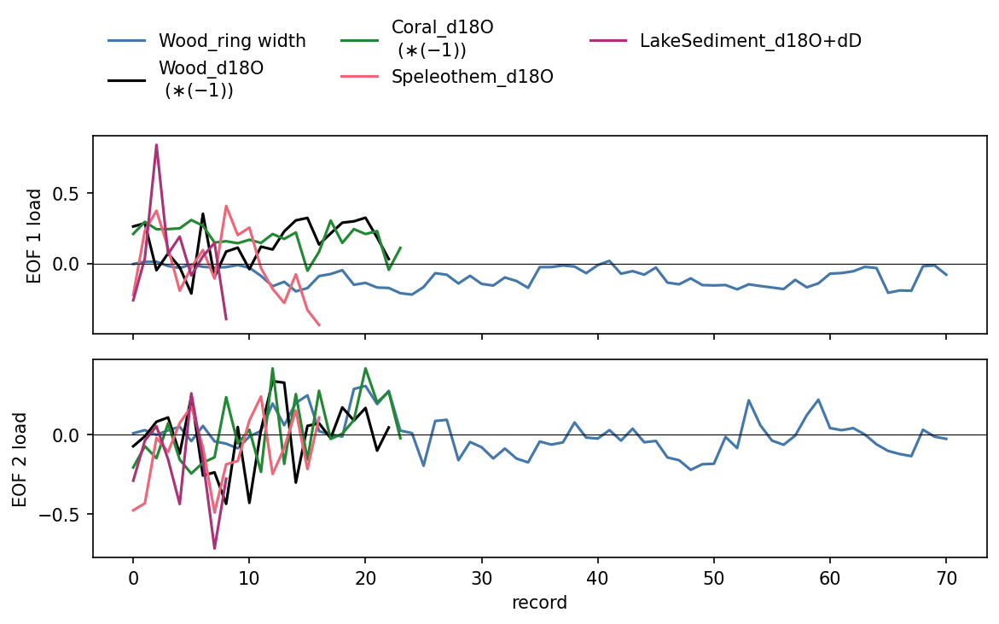

In [77]:

fig = plt.figure(figsize=(8,5), dpi=150)

grid = GS(2,1)
for key in keys:
    n_recs = data[key].shape[0]
    for ii in range(2):
        ax = plt.subplot(grid[ii,:])
        a = -1 if ((key in ['Wood_d18O', 'Coral_d18O'])) else 1
        label = key+'\n ($\\ast(-1)$)' if ((key in ['Wood_d18O', 'Coral_d18O'])) else key
        plt.plot(range(n_recs), a*EOFs[key][ii], label=label, color=key_colour[key])
        if ii==1: plt.xlabel('record')
        plt.ylabel('EOF %d load'%(ii+1))
        plt.axhline(0, color='k', alpha=0.5, lw=0.5)
        if ii==0: 
            ax.axes.xaxis.set_ticklabels([])
        if ii==0: plt.legend(bbox_to_anchor=(0,1.1), loc='lower left', ncol=3, framealpha=0)
grid.tight_layout(fig)

### spatial EOF load

{'Wood_ring width': 1, 'Wood_d18O': 1, 'Coral_d18O': 1, 'Speleothem_d18O': 1, 'LakeSediment_d18O+dD': 1}
-0.6
0.6
saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0_filtered_M_TM/MT_spatial_EOF1.pdf


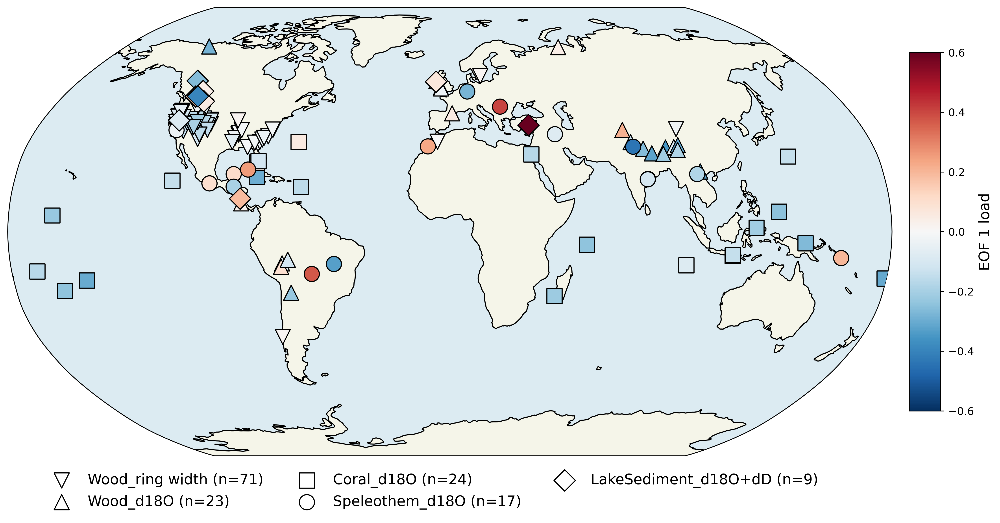

In [85]:
fig = uplt.geo_EOF_plot(df, pca_rec, EOFs, keys, barlabel='EOF 1 load', which_EOF=0)
#print(keys)
utf.save_fig(fig, 'MT_spatial_EOF1', dir=df.name)


{'Wood_ring width': 1, 'Wood_d18O': 1, 'Coral_d18O': 1, 'Speleothem_d18O': 1, 'LakeSediment_d18O+dD': 1}
-0.6
0.6
saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0_filtered_M_TM/MT_spatial_EOF2.pdf


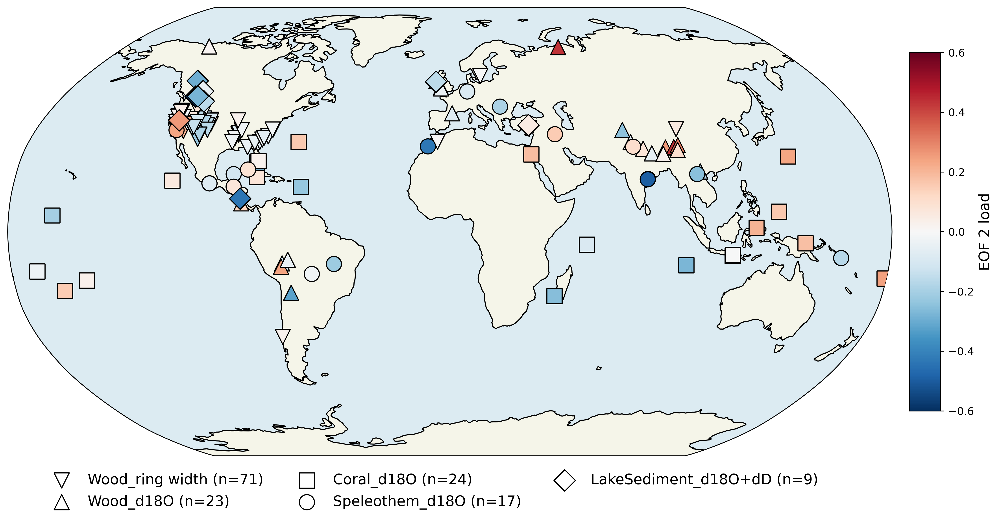

In [86]:
fig = uplt.geo_EOF_plot(df, pca_rec, EOFs, keys, barlabel='EOF 2 load', which_EOF=1)
#print(keys)
utf.save_fig(fig, 'MT_spatial_EOF2', dir=df.name)


### spatial distribution

0 Wood 3650
1 Speleothem 567
2 Coral 312
3 GlacierIce 162
4 MarineSediment 126
5 LakeSediment 111
6 Documents 13
7 Sclerosponge 6
8 GroundIce 4
9 Borehole 3
10 Other 2
11 MolluskShell 1
saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0_filtered_M_TM/MT_spatial.pdf


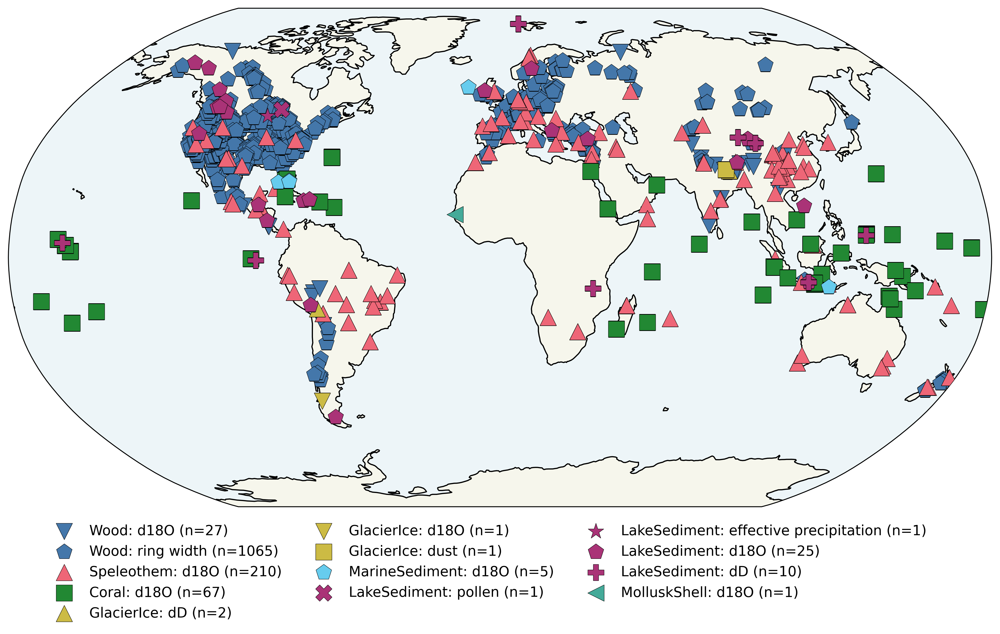

In [88]:
fig = uplt.geo_plot(df, fs=(13,8))

utf.save_fig(fig, 'MT_spatial', dir=df.name)

saved figure in /home/jupyter-lluecke/dod2k/figs/dod2k_v2.0_filtered_M_TM/MT_PCA.pdf


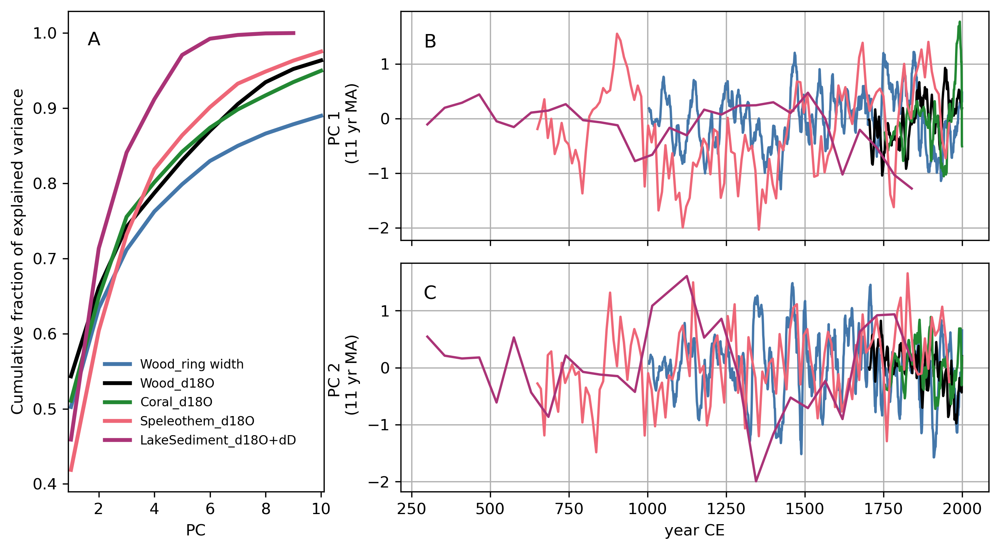

In [92]:
# as a comparison plot the mean over all records SMOOTHED
fig = plt.figure(figsize=(9, 5), dpi=300)

grid = GS(2,3)

ax=plt.subplot(grid[:,0])
ax  = plt.gca()
# ax2 = ax.twinx()
for key in keys:
    # ax.plot(range(1,9), foev[key][:8], label=key, color=key_colour[key])
    ax.plot(range(1,len(foev[key][:10])+1), np.cumsum(foev[key][:10]), label=key, color=key_colour[key], lw=2.5)
ax.set_ylabel('Cumulative fraction of explained variance')
ax.set_xlabel('PC')    
ax.set_xlim(.9,10.1)
plt.title('A', x=0.1, y=0.91)

grid.tight_layout(fig)
grid.update(hspace=0.1,wspace=0.3)
plt.legend(ncol=1, bbox_to_anchor=(0.1,0.3), 
           loc='upper left', framealpha=0, fontsize=8, facecolor='white')
# plt.grid()

smooth = 11
            
for key in keys:
    label = key
    resolution = np.unique(np.diff(time[key]))[0]
    #print(resolution, smooth, int(smooth/resolution))

    if resolution<smooth:
        tt, dd = uta.smooth(np.ma.mean(data[key], axis=0), time[key], smooth)
    else:
        tt, dd = time[key], np.ma.mean(data[key], axis=0)
    
    for ii in range(2):
        ax = plt.subplot(grid[ii,1:4])
        # warmer and wetter is more negative in coral d18O; 
        # warmer is more positive and wetter is more negative (maybe?) in tree d18O
        if ((key in ['Wood_d18O', 'Coral_d18O'])):
            a = -1 # multiply PC sign by -1
            label+= ' ($\\ast(-1)$)' # and label it as such
        else:
            a = 1
        if resolution<smooth:
            tt, dd = uta.smooth(PCs[key][ii], time[key], int(smooth/resolution))
        else:
            tt, dd = time[key], PCs[key][ii]
        plt.plot(tt, a*np.array(dd), label=label, color=key_colour[key], lw=1.5)
        plt.ylabel('PC %d \n (%d yr MA)'%(ii+1, smooth))
        plt.grid()
        if ii==0: 
            ax.axes.xaxis.set_ticklabels([])
        plt.title('BC'[ii], x=0.05, y=0.8)
        # plt.xlim(1750, 2010)
        
plt.xlabel('year CE')


utf.save_fig(fig, 'MT_PCA', dir=df.name)